<h1 style="text-align:center;"><font color=blue size=5><b>Machine Learning Project  :</b></font> <font color=red size=5><b>Customer churn prediction in telecom sector using machine 
learning techniques</b></font></h1>


## About This Notebook 📚:

In this notebook, we aim to predict customer churn in the telecommunications industry using various machine learning models. Churn refers to the event of customers leaving a service or canceling a subscription. Identifying and preventing churn is critical for maintaining customer loyalty and optimizing revenue.

### Dataset Overview 📊:
The dataset provides information about customer demographics, usage behavior, and interactions with customer support. Using these features, we can build predictive models to identify customers at risk of churning and recommend personalized retention strategies.

Here's a breakdown of its key features:

1. State: Customer's state (categorical).
2. Account length: Duration of the customer's account (numeric).
3. Area code: Area code of the customer's phone number (numeric).
4. International plan: Subscription to an international plan (binary: "Yes"/"No").
5. Voice mail plan: Subscription to a voicemail plan (binary: "Yes"/"No").
6. Number vmail messages: Number of voicemail messages (numeric).
7. Total day minutes: Total minutes used during the day (numeric). 
8. Total day calls: Total calls made during the day (numeric). 
9. Total day charge: Total charge for daytime usage (numeric). 
10. Total eve minutes: Total minutes used during the evening (numeric). 
11. Total eve calls: Total calls made during the evening (numeric). 
12. Total eve charge: Total charge for evening usage (numeric). 
13. Total night minutes: Total minutes used during the night (numeric). 
14. Total night calls: Total calls made during the night (numeric). 
15. Total night charge: Total charge for nighttime usage (numeric). 
16. Total intl minutes: Total international minutes used (numeric). 
17. Total intl calls: Total international calls made (numeric). 
18. Total intl charge: Total charge for international usage (numeric).
19. Customer service calls: Number of calls made to customer service (numeric).
20. Churn: Indicates whether the customer has churned (binary: "True"/"False").

### Project Team 👩‍💻👨‍💻:
The project was conducted by a team consisting of six members: **Mohamed Amine Yahyaoui**, **Sami Ghazouani**, **Eya Touti**, **Yassine Zayane**, **Hadil Sediri** and **Sara Hammouda**.

### Algorithms and Accuracies 📈:
- Random Forest: 76%
- K-Nearest Neighbors (KNN): 82%
- MLP: 90%
- TabNet: 92%

### CRISP-DM Methodology 🔄:
This project follows the CRISP-DM framework:
1. **Business Understanding**: Define goals and the importance of churn prediction.
2. **Data Understanding**: Analyze the data to identify patterns and distributions.
3. **Data Preparation**: Clean and preprocess the data for machine learning.
4. **Modeling**: Train and evaluate predictive models.
5. **Evaluation**: Assess model performance using metrics like Accuracy, AUC, Precision, etc.
6. **Deployment**: Save the best model for deployment and provide recommendations.

### Business Objective 🎯:
Reduce churn and improve customer loyalty to optimize revenue and market share.

### Data Science Objective 🧑‍💻:
Build robust models to predict, explain, and prevent churn by fully leveraging customer data, with a focus on interpretability and personalization.


#### Import Libaries :

In [214]:
%pip install pandas numpy seaborn mlxtend matplotlib scikit-learn xgboost imbalanced-learn tensorflow transformers pytorch-tabnet

Note: you may need to restart the kernel to use updated packages.


In [70]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import seaborn as sns
import time
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
import math
from scipy.stats import zscore




## I- Data Understanding

#### 1- Import Data

In [71]:
#Read the dataset
set = pd.read_csv('churn-bigml-80.csv')
#Read the test dataset
set_t = pd.read_csv('churn-bigml-20.csv')

#### 2- Data Overview

Returns the first 5 rows of the DataFrame.

In [72]:
set.head(5)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


Returns the last 5 rows of the DataFrame

In [73]:
set.tail(5)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
2665,TN,74,415,No,Yes,25,234.4,113,39.85,265.9,82,22.60,241.4,77,10.86,13.7,4,3.70,0,False


Provides a concise summary of the DataFrame

In [74]:
print(set.dtypes)

State                      object
Account length              int64
Area code                   int64
International plan         object
Voice mail plan            object
Number vmail messages       int64
Total day minutes         float64
Total day calls             int64
Total day charge          float64
Total eve minutes         float64
Total eve calls             int64
Total eve charge          float64
Total night minutes       float64
Total night calls           int64
Total night charge        float64
Total intl minutes        float64
Total intl calls            int64
Total intl charge         float64
Customer service calls      int64
Churn                        bool
dtype: object


In [75]:
set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

Statistical Summary of Key Features in the Dataset

In [76]:
 # data decription
set.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


Returns a tuple representing the dimensions of the DataFrame (number of rows, number of columns).

In [77]:
#data shape
print(set.shape)

(2666, 20)


Returns the column labels of the DataFrame.

In [78]:
set.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

Number of null value

In [79]:
set.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

Number of nan values

In [80]:
set.isna().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

Display numerical features

In [81]:
set.select_dtypes(include=np.number).columns.tolist()

['Account length',
 'Area code',
 'Number vmail messages',
 'Total day minutes',
 'Total day calls',
 'Total day charge',
 'Total eve minutes',
 'Total eve calls',
 'Total eve charge',
 'Total night minutes',
 'Total night calls',
 'Total night charge',
 'Total intl minutes',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls']

This dataset have 16 numerical features.

Categorical Column Analysis: Counts and Percentages

In [82]:
# Identifier les colonnes catégoriques
categorical_columns = set.select_dtypes(include=['object']).columns

# Dictionnaire pour stocker les résultats
value_counts_dict = {}

# Calcul des comptes et des pourcentages pour chaque colonne catégorique
for column in categorical_columns:
    counts = set[column].value_counts()
    percentages = set[column].value_counts(normalize=True) * 100
    value_counts_dict[column] = pd.DataFrame({'Count': counts, 'Percentage': percentages})

# Affichage des résultats
for column, counts_df in value_counts_dict.items():
    print(f"Valeurs et pourcentages pour la colonne '{column}':")
    print(counts_df)
    print()

Valeurs et pourcentages pour la colonne 'State':
       Count  Percentage
State                   
WV        88    3.300825
MN        70    2.625656
NY        68    2.550638
VA        67    2.513128
WY        66    2.475619
AL        66    2.475619
OH        66    2.475619
OR        62    2.325581
WI        61    2.288072
NV        61    2.288072
UT        60    2.250563
MD        60    2.250563
CO        59    2.213053
CT        59    2.213053
MI        58    2.175544
VT        57    2.138035
NC        56    2.100525
ID        56    2.100525
TX        55    2.063016
FL        54    2.025506
IN        54    2.025506
MT        53    1.987997
KS        52    1.950488
OK        52    1.950488
MA        52    1.950488
DE        51    1.912978
MO        51    1.912978
NJ        50    1.875469
SD        49    1.837959
SC        49    1.837959
GA        49    1.837959
ME        49    1.837959
WA        48    1.800450
MS        48    1.800450
RI        48    1.800450
AR        47    1.762941
I

Number of duplicates

In [83]:
set.duplicated().sum()

np.int64(0)

### Data exploration

Distribution of Target Variable: Churn

In [84]:
print(set['Churn'].value_counts())

Churn
False    2278
True      388
Name: count, dtype: int64


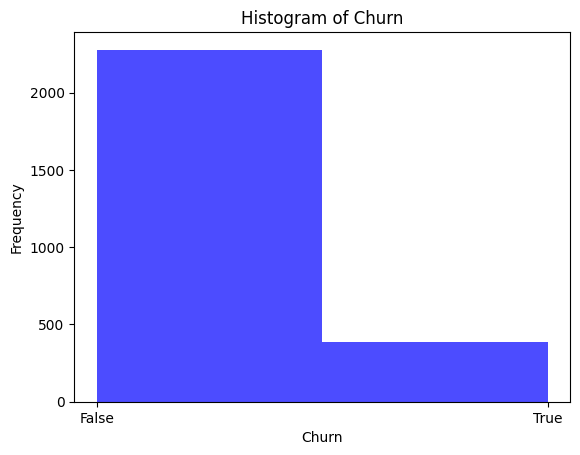

In [85]:

# Convert the 'Churn' column to 1 (True) and 0 (False)
set['Churn_numeric'] = set['Churn'].astype(int)

# Plotting the histogram of the 'Churn_numeric' column (0/1 values)
plt.hist(set['Churn_numeric'], bins=2, color='blue', alpha=0.7)
plt.title('Histogram of Churn')
plt.xlabel('Churn')
plt.ylabel('Frequency')
plt.xticks([0, 1], ['False', 'True'])  # Set x-ticks to show 'False' and 'True' instead of 0 and 1
plt.show()
set = set.drop(columns=['Churn_numeric'])



In [86]:
#calculate the relative frequencies of unique values in the "Churn" column
set["Churn"].value_counts() / len(set)

Churn
False    0.854464
True     0.145536
Name: count, dtype: float64

This indicates that the target variable "Churn" is imbalanced, as the majority of observations belong to the "False" class (no churn). The "True" class (churn) represents a significantly smaller portion of the data.

Description of the Target Variable:

In [87]:
# Describe the target
print(set['Churn'].describe())

count      2666
unique        2
top       False
freq       2278
Name: Churn, dtype: object


Distribution of Numerical Features

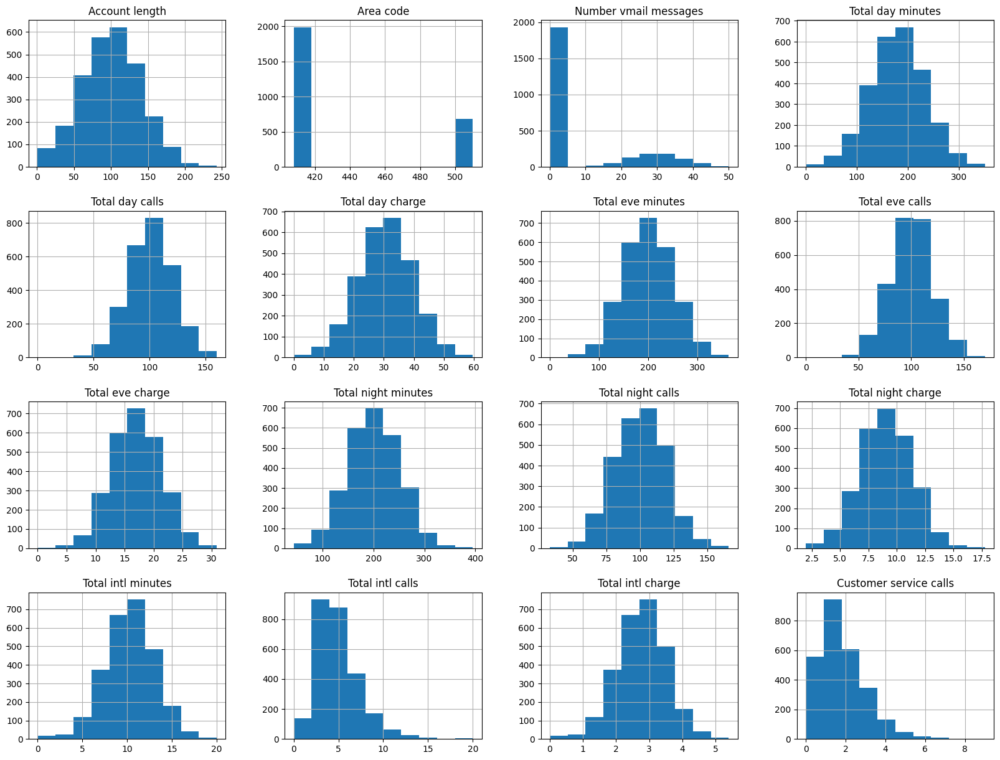

In [88]:
# Displying Histograms
set.hist(figsize=(20,15))
plt.show()

- Most numerical features exhibit normal or symmetrical distributions, suggesting they are well-behaved and not heavily skewed.
- Certain features, like "Number vmail messages" and "Customer service calls", are skewed, showing distinct behaviors or outliers for specific user groups.
- The "Area code" column indicates categorical behavior despite being numerical, as it has only a few distinct values.

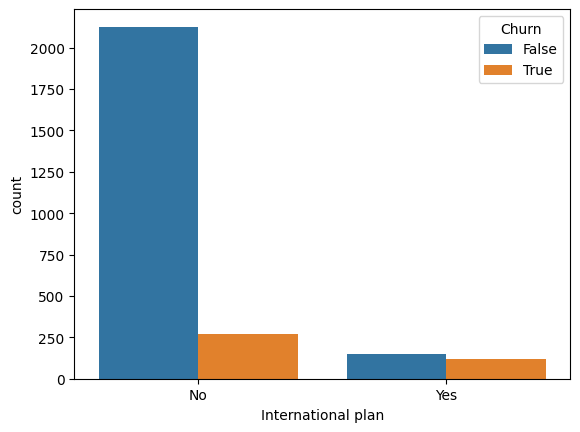

In [89]:
sns.countplot(x = 'International plan',hue = "Churn",data = set)
plt.show()

Customers with the "International Plan" seem to have a higher churn rate relative to those without it.

Churn Distribution Based on Voice Mail Plan

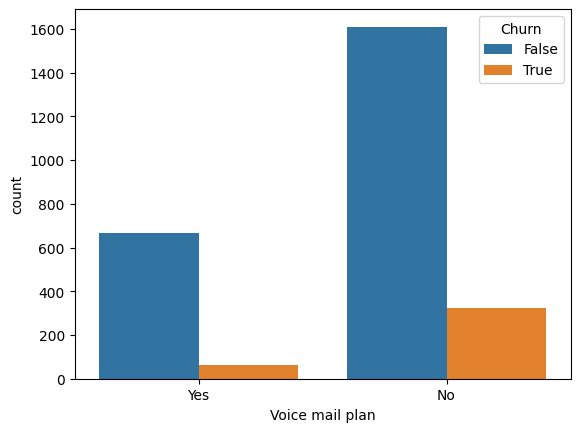

In [90]:
sns.countplot(x = 'Voice mail plan',hue = "Churn",data = set)
plt.show()

Customers without a voice mail plan have a higher churn rate compared to those with the plan.


Outlier Detection

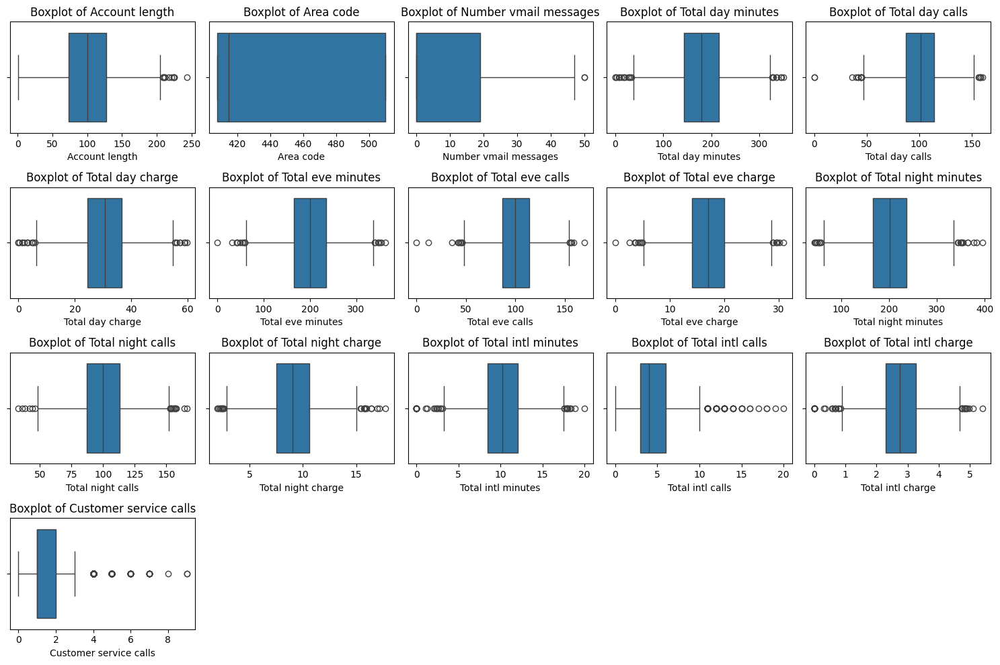

In [91]:

# Assuming 'set' is your DataFrame
# Extract numeric columns
numeric_columns = set.select_dtypes(include=['number']).columns

# Create a figure
plt.figure(figsize=(15, 10))

# Determine the number of rows and columns dynamically
num_columns = len(numeric_columns)
rows = math.ceil(num_columns / 5)  # 5 subplots per row

# Generate boxplots
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(rows, 5, i)  # Adjust grid dynamically
    sns.boxplot(data=set, x=col)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

plt.tight_layout()
plt.show()


Most numeric features show some outliers, especially "Total Intl Calls" and "Customer Service Calls," which might indicate specific customer behaviors or unusual patterns.


Outliers Detection with zscore :

In [92]:
z_scores = set.select_dtypes(include=['int64', 'float64']).apply(zscore)
outliers = (z_scores.abs() > 3).sum()
print("Nombre d'outliers par colonne :")
print(outliers)

Nombre d'outliers par colonne :
Account length             6
Area code                  0
Number vmail messages      2
Total day minutes          9
Total day calls            4
Total day charge           9
Total eve minutes          7
Total eve calls            4
Total eve charge           7
Total night minutes        9
Total night calls          5
Total night charge         9
Total intl minutes        19
Total intl calls          41
Total intl charge         19
Customer service calls    28
dtype: int64


The outlier detection using the Z-score method reveals that Total intl calls (41 outliers) and Customer service calls (28 outliers) have the highest number of outliers, indicating unusual customer behaviors in these areas.

Correlation Matrix Heatmap

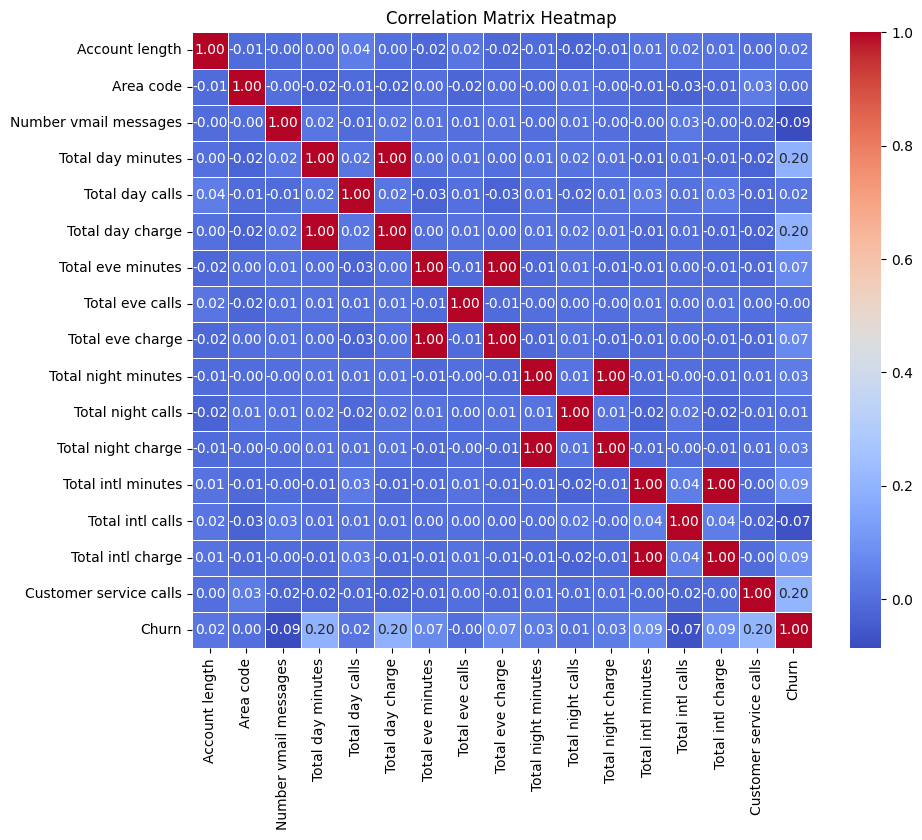

In [93]:
corr = set.corr(numeric_only=True)
# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar=True)

# Display the plot
plt.title("Correlation Matrix Heatmap")
plt.show()


The values range from -1 to 1, where:

1 indicates a perfect positive correlation,
-1 indicates a perfect negative correlation, and
0 indicates no correlation.

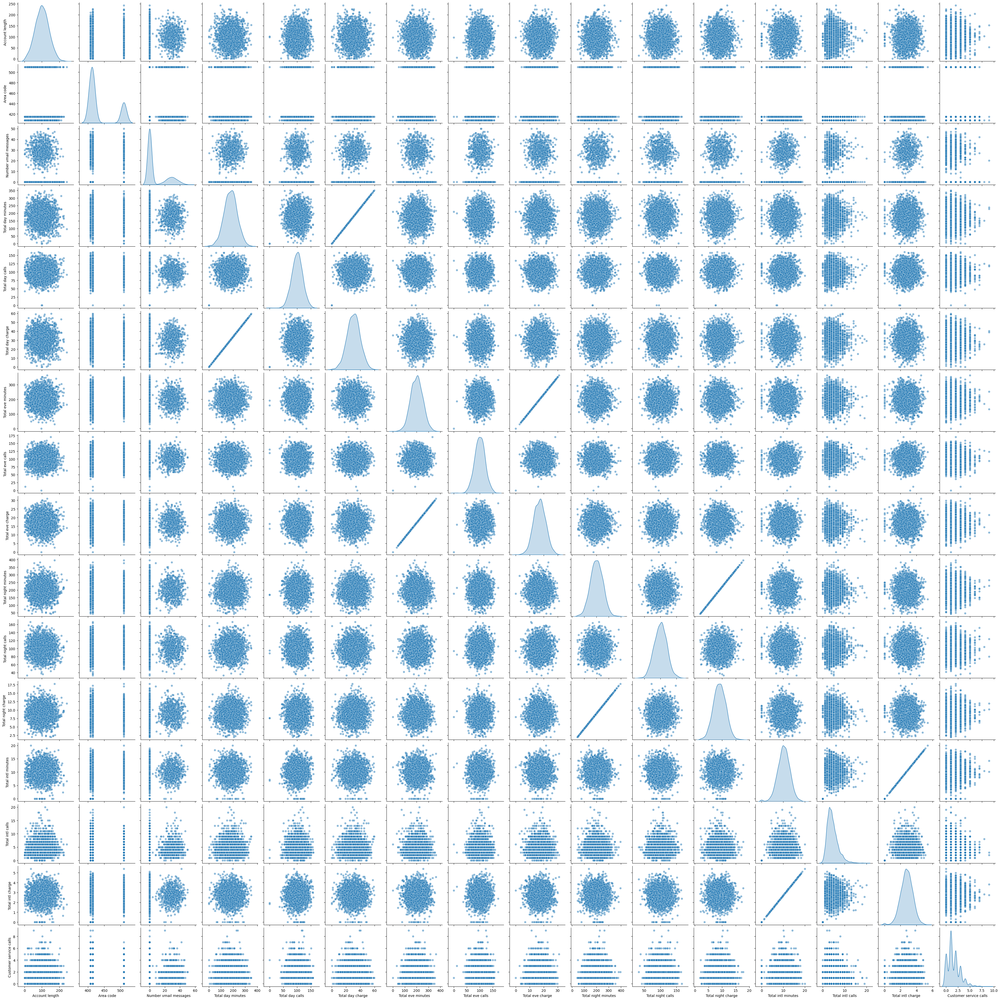

In [94]:

# Selecting numeric columns for the pair plot
numeric_columns = set.select_dtypes(include=['float64', 'int64']).columns

# Creating the pair plot
sns.pairplot(set[numeric_columns], diag_kind="kde", plot_kws={'alpha': 0.5})
plt.show()


It's obvious that there are several highly correlated fields, ie Total day minutes and Total day charge. Such correlated data won't be very beneficial for our model training runs, so we're going to remove them. We'll do so by dropping one column of each pair of correlated fields.

Feature Selection Summary Using Statistical Tests


In [95]:
import pandas as pd
from scipy.stats import chi2_contingency, f_oneway

# Identify qualitative and quantitative features
qualitative_features = set.select_dtypes(include=['object', 'category']).columns.tolist()
numeric_features = set.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Dictionary to store Chi-squared test results
chi2_results = {}

for feature in qualitative_features:
    if feature in set.columns and feature != 'Churn':  # Exclude the target column
        # Create a contingency table
        contingency_table = pd.crosstab(set[feature], set['Churn'])

        # Perform the Chi-squared test
        chi2, p_value, _, _ = chi2_contingency(contingency_table)

        # Store the p-value
        chi2_results[feature] = {
            'Test': 'Chi-squared',
            'p-value': p_value,
            'F-statistic': None  # Chi-squared does not produce F-statistic
        }

# Convert Chi-squared results to DataFrame
chi2_results_df = pd.DataFrame(chi2_results).T

# Dictionary to store ANOVA results
anova_results = {}

for feature in numeric_features:
    if feature in set.columns and feature != 'Churn':  # Exclude the target column
        # Create groups based on the target column
        groups = [group[feature].dropna().values for _, group in set.groupby('Churn')]

        # Check if all groups have sufficient data
        if all(len(group) >= 2 for group in groups):
            # Perform ANOVA
            f_statistic, p_value = f_oneway(*groups)
            anova_results[feature] = {
                'Test': 'ANOVA',
                'p-value': p_value,
                'F-statistic': f_statistic
            }
        else:
            print(f"Skipping {feature}: insufficient data in one or more groups.")

# Convert ANOVA results to DataFrame
anova_results_df = pd.DataFrame(anova_results).T

# Combine results
combined_results_df = pd.concat([chi2_results_df, anova_results_df])

# Sort combined results by p-value
combined_results_df_sorted = combined_results_df.sort_values(by='p-value', na_position='last')

# Display sorted results
print(combined_results_df_sorted)

# Identify non-significant columns based on p-value > 0.05
non_significant_columns = combined_results_df_sorted[combined_results_df_sorted['p-value'] > 0.05].index.tolist()

# Drop non-significant columns from the dataset
set = set.drop(columns=non_significant_columns, errors='ignore')

# Display the remaining columns
print("\nRemaining columns after dropping non-significant features:")
print(set.columns)

                               Test   p-value F-statistic
International plan      Chi-squared       0.0        None
Customer service calls        ANOVA       0.0   114.01765
Total day charge              ANOVA       0.0  106.077794
Total day minutes             ANOVA       0.0  106.076663
Voice mail plan         Chi-squared       0.0        None
Number vmail messages         ANOVA  0.000008   20.070885
Total intl charge             ANOVA  0.000008   19.950391
Total intl minutes            ANOVA  0.000008   19.944635
Total eve minutes             ANOVA  0.000165    14.23569
Total eve charge              ANOVA  0.000165   14.230587
Total intl calls              ANOVA  0.000305   13.073361
State                   Chi-squared  0.004681        None
Total night minutes           ANOVA  0.082462    3.017967
Total night charge            ANOVA  0.082496    3.017305
Total day calls               ANOVA  0.345156    0.891502
Account length                ANOVA  0.360192    0.837514
Total night ca

Based on the p-values, features with a p-value > 0.05 were dropped, leaving the following columns for further analysis:
- State
- International plan
- Voice mail plan
- Number vmail messages
- Total day minutes
- Total day charge
- Total eve minutes
- Total eve charge
- Total intl minutes
- Total intl calls
- Total intl charge
- Customer service calls

These remaining features exhibit a significant relationship with Churn, making them valuable for building predictive models.

# II-Data Preparation

Data Encoding for Binary Features

In [96]:
# Copying the dataset (assuming `set` is your original DataFrame)
df = set.copy()
tf = set_t.copy()

# Define the binary map for encoding
binary_map = {'Yes': 1, 'No': 0, True: 1, False: 0}

# Perform encoding first
df['Churn'] = df['Churn'].map(binary_map)
df['International plan'] = df['International plan'].map(binary_map)
df['Voice mail plan'] = df['Voice mail plan'].map(binary_map)

tf['Churn'] = tf['Churn'].map(binary_map)
tf['International plan'] = tf['International plan'].map(binary_map)
tf['Voice mail plan'] = tf['Voice mail plan'].map(binary_map)


After applying the encoding, the values in the columns Churn, International plan, and Voice mail plan are converted into numeric format (1 or 0), making them suitable for modeling and statistical analysis.

In [97]:
df.head()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day charge,Total eve minutes,Total eve charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,0,1,25,265.1,45.07,197.4,16.78,10.0,3,2.70,1,0
1,OH,0,1,26,161.6,27.47,195.5,16.62,13.7,3,3.70,1,0
2,NJ,0,0,0,243.4,41.38,121.2,10.30,12.2,5,3.29,0,0
3,OH,1,0,0,299.4,50.90,61.9,5.26,6.6,7,1.78,2,0
4,OK,1,0,0,166.7,28.34,148.3,12.61,10.1,3,2.73,3,0


In [98]:
from sklearn.preprocessing import LabelEncoder

# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'State' column and store the encoded values in a new column
df['State_Encoded'] = label_encoder.fit_transform(df['State'])

# Reorder columns to ensure 'State_Encoded' is next to 'State'
df = df[['State', 'State_Encoded'] + [col for col in df.columns if col not in ['State', 'State_Encoded']]]

# Verify the transformation
print(df[['State', 'State_Encoded']].head())


  State  State_Encoded
0    KS             16
1    OH             35
2    NJ             31
3    OH             35
4    OK             36


In [99]:
# Create a mapping of the State names to their encoded values
state_mapping = dict(zip(df['State'], df['State_Encoded']))

# Display the mapping
print(state_mapping)


{'KS': 16, 'OH': 35, 'NJ': 31, 'OK': 36, 'AL': 1, 'MA': 19, 'MO': 24, 'WV': 49, 'RI': 39, 'IA': 12, 'MT': 26, 'ID': 13, 'VT': 46, 'VA': 45, 'TX': 43, 'FL': 9, 'CO': 5, 'AZ': 3, 'NE': 29, 'WY': 50, 'IL': 14, 'NH': 30, 'LA': 18, 'GA': 10, 'AK': 0, 'MD': 20, 'AR': 2, 'WI': 48, 'OR': 37, 'DE': 8, 'IN': 15, 'UT': 44, 'CA': 4, 'SD': 41, 'NC': 27, 'WA': 47, 'MN': 23, 'NM': 32, 'NV': 33, 'DC': 7, 'NY': 34, 'KY': 17, 'ME': 21, 'MS': 25, 'MI': 22, 'SC': 40, 'TN': 42, 'PA': 38, 'HI': 11, 'ND': 28, 'CT': 6}


In [100]:
tf['State'] = tf['State'].map(state_mapping)


In [101]:
# Drop the 'State' column
df = df.drop(columns=['State'])


In [102]:
df.head()

,State_Encoded,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day charge,Total eve minutes,Total eve charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,0,1,25,265.1,45.07,197.4,16.78,10.0,3,2.70,1,0
1,35,0,1,26,161.6,27.47,195.5,16.62,13.7,3,3.70,1,0
2,31,0,0,0,243.4,41.38,121.2,10.30,12.2,5,3.29,0,0
3,35,1,0,0,299.4,50.90,61.9,5.26,6.6,7,1.78,2,0
4,36,1,0,0,166.7,28.34,148.3,12.61,10.1,3,2.73,3,0


In [103]:
# Rename 'State_Encoded' to 'State'
df = df.rename(columns={'State_Encoded': 'State'})

# Verify the result
df.head()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day charge,Total eve minutes,Total eve charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,0,1,25,265.1,45.07,197.4,16.78,10.0,3,2.70,1,0
1,35,0,1,26,161.6,27.47,195.5,16.62,13.7,3,3.70,1,0
2,31,0,0,0,243.4,41.38,121.2,10.30,12.2,5,3.29,0,0
3,35,1,0,0,299.4,50.90,61.9,5.26,6.6,7,1.78,2,0
4,36,1,0,0,166.7,28.34,148.3,12.61,10.1,3,2.73,3,0


In [104]:
tf.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,18,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
1,15,65,415,0,0,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,1
2,34,161,415,0,0,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,1
3,40,111,415,0,0,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,0
4,11,49,510,0,0,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,0


Dropping

Dropping non-significant columns based on p-value > 0.05

In [105]:
# Identify non-significant columns based on p-value > 0.05
non_significant_columns = combined_results_df_sorted[combined_results_df_sorted['p-value'] > 0.05].index.tolist()

# Drop non-significant columns from the dataset
df = df.drop(columns=non_significant_columns, errors='ignore')
tf = tf.drop(columns=non_significant_columns, errors='ignore')


# Display the remaining columns
print("\nRemaining columns after dropping non-significant features:")
print(df.columns)
print(tf.columns)


Remaining columns after dropping non-significant features:
Index(['State', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day minutes', 'Total day charge',
       'Total eve minutes', 'Total eve charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')
Index(['State', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day minutes', 'Total day charge',
       'Total eve minutes', 'Total eve charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')


Dropping non-significant columns based on Matrix of Corelation Heatmap

In [106]:
# List of columns to drop
columns_to_drop = ['Total day charge', 'Total eve charge', 'Total intl charge']

# Drop the columns from df and tf
df = df.drop(columns=columns_to_drop)
tf = tf.drop(columns=columns_to_drop)

# Verify the changes
print(df.shape)
print(tf.shape)

(2666, 10)
(667, 10)


Outlier Detection and Handling Using IQR

In [107]:
# Calcul des limites IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Colonnes à exclure de l'analyse (binaires ou target)
exclude_columns = ['International plan', 'Voice mail plan', 'Churn']

# Détection et traitement des outliers pour les colonnes numériques restantes
for col in df.columns:
    if col not in exclude_columns:
        lower_bound = Q1[col] - 1.5 * IQR[col]
        upper_bound = Q3[col] + 1.5 * IQR[col]
        df[col] = np.where(df[col] < lower_bound, lower_bound,
                           np.where(df[col] > upper_bound, upper_bound, df[col]))

# Vérification après traitement
print(df.describe())


             State  International plan  Voice mail plan  \
count  2666.000000         2666.000000      2666.000000   
mean     26.036009            0.101275         0.274944   
std      14.921792            0.301750         0.446570   
min       0.000000            0.000000         0.000000   
25%      13.000000            0.000000         0.000000   
50%      26.000000            0.000000         0.000000   
75%      39.000000            0.000000         1.000000   
max      50.000000            1.000000         1.000000   

       Number vmail messages  Total day minutes  Total eve minutes  \
count            2666.000000        2666.000000        2666.000000   
mean                8.019880         179.533777         200.424944   
std                13.606662          53.835098          50.681362   
min                 0.000000          34.650000          60.600000   
25%                 0.000000         143.400000         165.300000   
50%                 0.000000         179.950000 

In this step, outliers in numerical columns are identified and handled using the Interquartile Range (IQR) method. The goal is to identify values that lie outside the range of typical data points (outside 1.5 times the IQR above or below the first and third quartiles), and then either remove or adjust them.

In [108]:
df.describe()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total intl minutes,Total intl calls,Customer service calls,Churn
count,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,26.036009,0.101275,0.274944,8.019880,179.533777,200.424944,10.254276,4.411478,1.477869,0.145536
std,14.921792,0.301750,0.446570,13.606662,53.835098,50.681362,2.715774,2.262104,1.105791,0.352707
min,0.000000,0.000000,0.000000,0.000000,34.650000,60.600000,3.100000,0.000000,0.000000,0.000000
25%,13.000000,0.000000,0.000000,0.000000,143.400000,165.300000,8.500000,3.000000,1.000000,0.000000
50%,26.000000,0.000000,0.000000,0.000000,179.950000,200.900000,10.200000,4.000000,1.000000,0.000000
75%,39.000000,0.000000,1.000000,19.000000,215.900000,235.100000,12.100000,6.000000,2.000000,0.000000
max,50.000000,1.000000,1.000000,47.500000,324.650000,339.800000,17.500000,10.500000,3.500000,1.000000


In [109]:
tf.head()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total intl minutes,Total intl calls,Customer service calls,Churn
0,18,0,0,0,184.5,351.6,8.7,4,1,0
1,15,0,0,0,129.1,228.5,12.7,6,4,1
2,34,0,0,0,332.9,317.8,5.4,9,4,1
3,40,0,0,0,110.4,137.3,7.7,6,2,0
4,11,0,0,0,119.3,215.1,11.1,1,1,0


In [43]:
from sklearn.preprocessing import MinMaxScaler

# Select the features to normalize
features_to_normalize = [
    'Number vmail messages', 
    'Total day minutes', 
    'Total eve minutes', 
    'Total intl minutes', 
    'Total intl calls', 
    'Customer service calls'
]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected features in the training set
X_normalized = scaler.fit_transform(df[features_to_normalize])
df[features_to_normalize] = X_normalized

# Apply the same transformation to the test set
X_normalized = scaler.transform(tf[features_to_normalize])
tf[features_to_normalize] = X_normalized


In this step, the dataset is normalized using the **MinMaxScaler** from scikit-learn, which scales the selected numerical features to a fixed range, typically between 0 and 1. This transformation ensures that each feature has a comparable scale, which is crucial for models that are sensitive to the magnitude of input features, such as distance-based algorithms or gradient-based methods. By normalizing the data in this way, the model avoids bias towards features with larger numerical ranges, leading to more stable and efficient training.

In [44]:
df.describe()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total intl minutes,Total intl calls,Customer service calls,Churn
count,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,26.036009,0.101275,0.274944,0.168840,0.499599,0.500806,0.496825,0.420141,0.422248,0.145536
std,14.921792,0.301750,0.446570,0.286456,0.185638,0.181524,0.188595,0.215438,0.315940,0.352707
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13.000000,0.000000,0.000000,0.000000,0.375000,0.375000,0.375000,0.285714,0.285714,0.000000
50%,26.000000,0.000000,0.000000,0.000000,0.501034,0.502507,0.493056,0.380952,0.285714,0.000000
75%,39.000000,0.000000,1.000000,0.400000,0.625000,0.625000,0.625000,0.571429,0.571429,0.000000
max,50.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [45]:
tf.describe()

,State,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total intl minutes,Total intl calls,Customer service calls,Churn
count,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000
mean,26.152924,0.079460,0.283358,0.177006,0.504476,0.511301,0.495721,0.431213,0.446777,0.142429
std,14.441785,0.270659,0.450967,0.294621,0.191409,0.178078,0.194990,0.236423,0.380959,0.349752
min,0.000000,0.000000,0.000000,0.000000,-0.030172,-0.044771,-0.215278,0.000000,0.000000,0.000000
25%,15.000000,0.000000,0.000000,0.000000,0.384828,0.395595,0.381944,0.285714,0.285714,0.000000
50%,26.000000,0.000000,0.000000,0.000000,0.495345,0.512536,0.513889,0.380952,0.285714,0.000000
75%,39.000000,0.000000,1.000000,0.421053,0.641552,0.629835,0.621528,0.571429,0.571429,0.000000
max,50.000000,1.000000,1.000000,1.073684,1.033276,1.078797,1.055556,1.714286,2.285714,1.000000


Dimensionality reduction

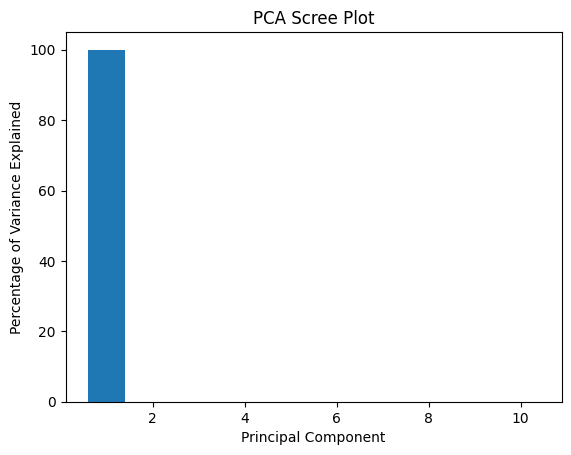

In [46]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Appliquer la PCA
pca = PCA()
X_pca = pca.fit_transform(df)

# Calculer la variance expliquée par chaque composante
percent_variance = np.round(pca.explained_variance_ratio_ * 100)

# Ajuster la plage d'index pour correspondre au nombre réel de composantes principales
plt.bar(x=range(1, len(percent_variance) + 1), height=percent_variance)

plt.ylabel('Percentage of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot')
plt.show()


The first principal component explains nearly 100% of the variance in your dataset.
The second and subsequent components contribute almost no variance.
This suggests that the dataset is highly unidimensional, and only the first principal component is needed to capture the data's variability.

Target Variable Visualization and SMOTE

In [47]:
# Count the occurrences of each label in the target variable
target_counts = df['Churn'].value_counts()

# Display the counts
print("Counts of each label in the target variable:")
print(target_counts)

Counts of each label in the target variable:
Churn
0    2278
1     388
Name: count, dtype: int64


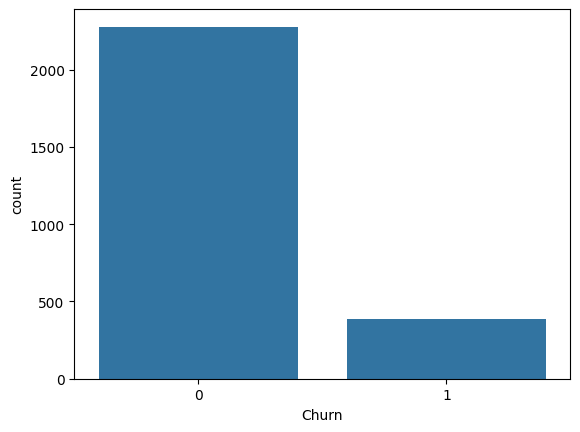

In [48]:
sns.countplot(x=df['Churn'])
plt.show()

In [49]:
from imblearn.over_sampling import SMOTE

# Separate features and target variable
X = df.drop(columns=['Churn'])
y = df['Churn']

# Initialize SMOTE
smote = SMOTE()

# Apply SMOTE to generate synthetic samples
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the new class distribution
print("Class distribution after applying SMOTE:")
print(y_resampled.value_counts())

Class distribution after applying SMOTE:
Churn
0    2278
1    2278
Name: count, dtype: int64


Churn Distribution after SMOTE

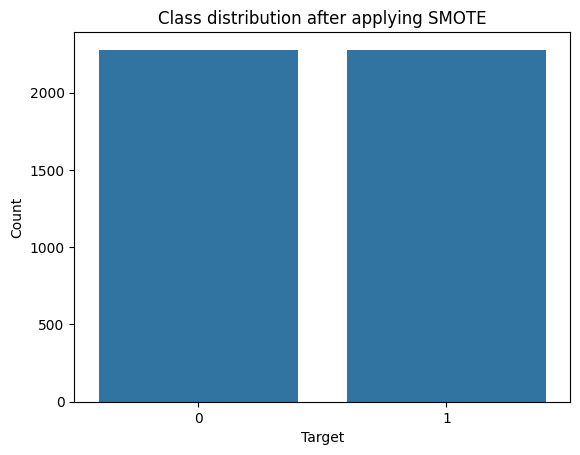

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot class distribution after applying SMOTE
sns.countplot(x=y_resampled)
plt.title("Class distribution after applying SMOTE")
plt.xlabel("Target")
plt.ylabel("Count")
plt.show()

## III-**Modeling**

KNN

In [51]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
import numpy as np

# Separate features and target from training and test datasets
X_train = X_resampled  # Features in the training dataset
y_train = y_resampled              # Target in the training dataset
X_test = tf.drop('Churn', axis=1)  # Features in the test dataset
y_test = tf['Churn']               # Target in the test dataset

In [52]:

# Display shapes of datasets
print('Train set:', X_train.shape, y_train.shape)
print('Test set:', X_test.shape, y_test.shape)


Train set: (4556, 9) (4556,)
Test set: (667, 9) (667,)


In [53]:
# Applying the KNN algorithm
k = 2  # Number of neighbors
knn_clf = KNeighborsClassifier(n_neighbors=k)
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=2)

In [54]:
# Predicting new observations
yhat = knn_clf.predict(X_test)

In [55]:
# Evaluation
print("Train set Accuracy: ", metrics.accuracy_score(y_train, knn_clf.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))

Train set Accuracy:  0.9771729587357331
Test set Accuracy:  0.815592203898051


In [56]:


# Initialize variables
Ks = 10  # Maximum value of k to test
mean_acc = np.zeros((Ks - 1))  # Array to store accuracies for each k

# Loop through values of k from 1 to Ks-1
for n in range(1, Ks):
    # Train the KNN model with n neighbors
    neigh = KNeighborsClassifier(n_neighbors=n).fit(X_train, y_train)
    
    # Predict the test set
    yhat = neigh.predict(X_test)
    
    # Calculate and store the accuracy for the current k
    mean_acc[n - 1] = metrics.accuracy_score(y_test, yhat)

# Display the accuracy for each k
print("Accuracy for each k:", mean_acc)




Accuracy for each k: [0.78110945 0.8155922  0.76911544 0.7946027  0.75562219 0.77361319
 0.74962519 0.77511244 0.74362819]


In [57]:
# Find and display the best k
best_k = mean_acc.argmax() + 1
print(f"The best accuracy was {mean_acc.max():.2f} with k = {best_k}")

The best accuracy was 0.82 with k = 2


Test set Accuracy:  0.815592203898051
Correctly classified instances: 544 (81.56%)
Incorrectly classified instances: 123 (18.44%)

Weighted Average Metrics:
Accuracy: 0.815592203898051
Precision (Weighted Avg): 0.82437000145876
Recall (Weighted Avg): 0.815592203898051
F1-Score (Weighted Avg): 0.8197430048922792
ROC-AUC (Weighted Avg): 0.6885995583364004

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       572
           1       0.37      0.41      0.39        95

    accuracy                           0.82       667
   macro avg       0.63      0.65      0.64       667
weighted avg       0.82      0.82      0.82       667



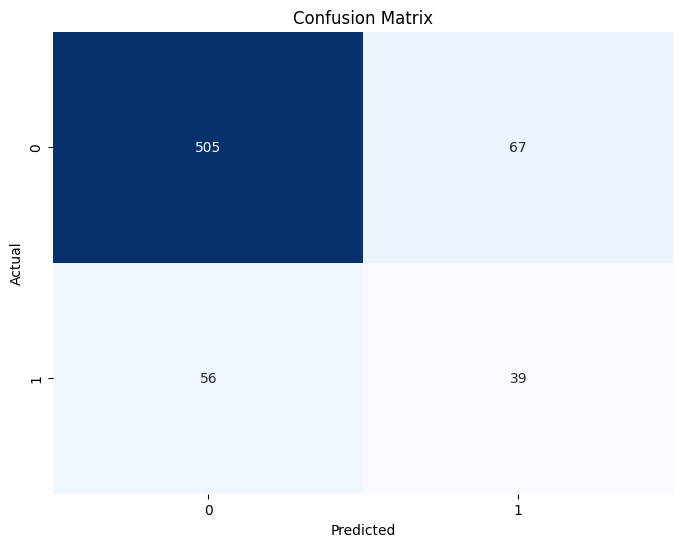

In [58]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report

# Ensure using the best k (k=2)
knn_clf = KNeighborsClassifier(n_neighbors=2)
knn_clf.fit(X_train, y_train)
yhat = knn_clf.predict(X_test)

# Now calculate metrics using the same model (k=2)
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))
conf_matrix = confusion_matrix(y_test, yhat)

# Correctly classified instances
correctly_classified = np.sum(np.diag(conf_matrix))
incorrectly_classified = np.sum(conf_matrix) - correctly_classified

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent = (correctly_classified / len(y_test)) * 100
incorrectly_classified_percent = (incorrectly_classified / len(y_test)) * 100

# Print results
print(f"Correctly classified instances: {correctly_classified} ({correctly_classified_percent:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified} ({incorrectly_classified_percent:.2f}%)")

# Evaluate other metrics
print("\nWeighted Average Metrics:")
print(f"Accuracy: {accuracy_score(y_test, yhat)}")
print(f"Precision (Weighted Avg): {precision_score(y_test, yhat, average='weighted')}")
print(f"Recall (Weighted Avg): {recall_score(y_test, yhat, average='weighted')}")
print(f"F1-Score (Weighted Avg): {f1_score(y_test, yhat, average='weighted')}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_score(y_test, knn_clf.predict_proba(X_test)[:, 1])}")

print("\nClassification Report:")
print(classification_report(y_test, yhat))

# Confusion matrix plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Decision Tree


Decision Tree Classifier:
Correctly classified instances: 578 (86.66%)
Incorrectly classified instances: 89 (13.34%)

Weighted Average Metrics for Decision Tree:
Accuracy: 0.8665667166416792
Precision (Weighted Avg): 0.9004380359185433
Recall (Weighted Avg): 0.8665667166416792
F1-Score (Weighted Avg): 0.8775721397386521
ROC-AUC (Weighted Avg): 0.8388111888111888

Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       572
           1       0.52      0.80      0.63        95

    accuracy                           0.87       667
   macro avg       0.74      0.84      0.77       667
weighted avg       0.90      0.87      0.88       667


Confusion Matrix for Decision Tree:


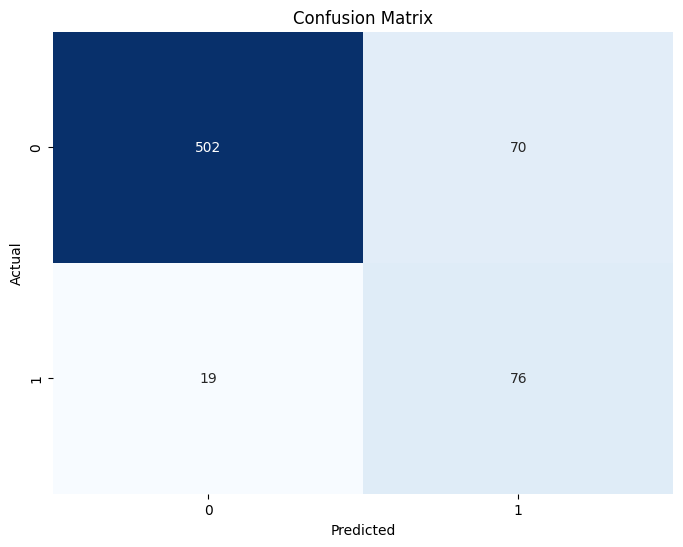

In [59]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report
import numpy as np

# Initialize the Decision Tree Classifier
dt_clf = DecisionTreeClassifier(random_state=42)

# Fit the Decision Tree model
dt_clf.fit(X_train, y_train)

# Prediction with the trained Decision Tree model
yhat_dt = dt_clf.predict(X_test)

# Calculate confusion matrix for Decision Tree
conf_matrix_dt = confusion_matrix(y_test, yhat_dt)

# Correctly classified instances for Decision Tree
correctly_classified_dt = np.sum(np.diag(conf_matrix_dt))  # Diagonal elements (TP + TN)
incorrectly_classified_dt = np.sum(conf_matrix_dt) - correctly_classified_dt  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_dt = (correctly_classified_dt / total_instances) * 100
incorrectly_classified_percent_dt = (incorrectly_classified_dt / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nDecision Tree Classifier:")
print(f"Correctly classified instances: {correctly_classified_dt} ({correctly_classified_percent_dt:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_dt} ({incorrectly_classified_percent_dt:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_dt = accuracy_score(y_test, yhat_dt)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_dt = precision_score(y_test, yhat_dt, average='weighted')
recall_weighted_dt = recall_score(y_test, yhat_dt, average='weighted')
f1_weighted_dt = f1_score(y_test, yhat_dt, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_dt = roc_auc_score(y_test, dt_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Decision Tree:")
print(f"Accuracy: {accuracy_dt}")
print(f"Precision (Weighted Avg): {precision_weighted_dt}")
print(f"Recall (Weighted Avg): {recall_weighted_dt}")
print(f"F1-Score (Weighted Avg): {f1_weighted_dt}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_dt}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Decision Tree:")
print(classification_report(y_test, yhat_dt))

# Confusion Matrix
print("\nConfusion Matrix for Decision Tree:")
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_dt, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Decision Tree Classifier Visualization

Model fitted successfully.


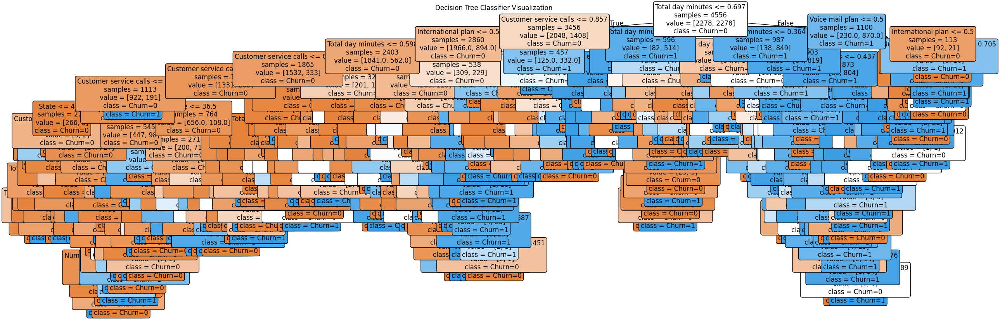

In [60]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Fit the Decision Tree model
dt_clf.fit(X_train, y_train)

# Print statement to ensure the model is fitted
print("Model fitted successfully.")

# Prediction with the trained model
yhat_dt = dt_clf.predict(X_test)

# Plot the decision tree
plt.figure(figsize=(30, 10))
plot_tree(dt_clf, 
          filled=True, 
          feature_names=tf.columns,  # Ensure 'tf.columns' is correctly defined
          class_names=['Churn=0', 'Churn=1'], 
          rounded=True, 
          fontsize=12, 
          impurity=False,  # Do not show Gini/entropy values
          proportion=False,  # Do not show proportions of each class
          label='all')  # Show both feature names and class names

plt.title("Decision Tree Classifier Visualization")
plt.show()

Decision Tree Hyperparameter Tuning with Grid Search

In [61]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

param_grid = {
    'max_depth': [5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', None],
}

dt_clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=dt_clf, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters found
print("Best parameters:", grid_search.best_params_)


Best parameters: {'max_depth': 15, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}



Decision Tree Classifier:
Correctly classified instances: 607 (91.00%)
Incorrectly classified instances: 60 (9.00%)

Weighted Average Metrics for Decision Tree:
Accuracy: 0.9100449775112444
Precision (Weighted Avg): 0.9204638706287882
Recall (Weighted Avg): 0.9100449775112444
F1-Score (Weighted Avg): 0.9138305431080243
ROC-AUC (Weighted Avg): 0.8705465587044534

Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       572
           1       0.65      0.80      0.72        95

    accuracy                           0.91       667
   macro avg       0.81      0.86      0.83       667
weighted avg       0.92      0.91      0.91       667



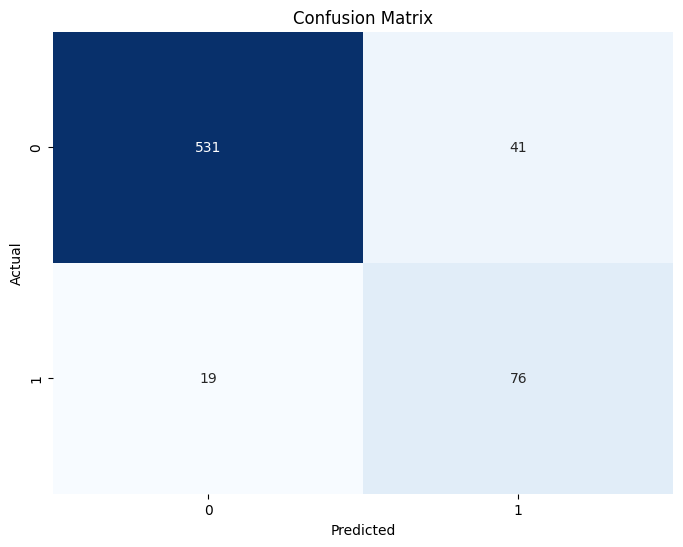

In [62]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report
import numpy as np

# Define the best parameters directly
best_params = {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}

# Initialize the Decision Tree Classifier with the best parameters
dt_clf_best = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    max_features=best_params['max_features'],
    min_samples_leaf=best_params['min_samples_leaf'],
    min_samples_split=best_params['min_samples_split'],
    random_state=42
)

# Fit the model with the training data
dt_clf_best.fit(X_train, y_train)

# Prediction with the trained Decision Tree model
yhat_dt = dt_clf_best.predict(X_test)

# Calculate confusion matrix for Decision Tree
conf_matrix_dt = confusion_matrix(y_test, yhat_dt)

# Correctly classified instances for Decision Tree
correctly_classified_dt = np.sum(np.diag(conf_matrix_dt))  # Diagonal elements (TP + TN)
incorrectly_classified_dt = np.sum(conf_matrix_dt) - correctly_classified_dt  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_dt = (correctly_classified_dt / total_instances) * 100
incorrectly_classified_percent_dt = (incorrectly_classified_dt / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nDecision Tree Classifier:")
print(f"Correctly classified instances: {correctly_classified_dt} ({correctly_classified_percent_dt:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_dt} ({incorrectly_classified_percent_dt:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_dt = accuracy_score(y_test, yhat_dt)
precision_weighted_dt = precision_score(y_test, yhat_dt, average='weighted')
recall_weighted_dt = recall_score(y_test, yhat_dt, average='weighted')
f1_weighted_dt = f1_score(y_test, yhat_dt, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_dt = roc_auc_score(y_test, dt_clf_best.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Decision Tree:")
print(f"Accuracy: {accuracy_dt}")
print(f"Precision (Weighted Avg): {precision_weighted_dt}")
print(f"Recall (Weighted Avg): {recall_weighted_dt}")
print(f"F1-Score (Weighted Avg): {f1_weighted_dt}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_dt}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Decision Tree:")
print(classification_report(y_test, yhat_dt))

# Confusion Matrix
# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_dt, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


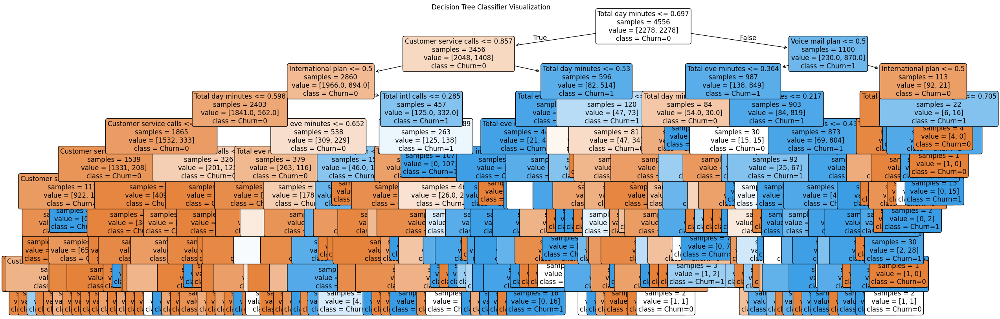

In [63]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Plot the decision tree
plt.figure(figsize=(30, 10))
plot_tree(dt_clf_best, 
          filled=True, 
          feature_names=tf.columns, 
          class_names=['Churn=0', 'Churn=1'], 
          rounded=True, 
          fontsize=12, 
          impurity=False,  # Do not show Gini/entropy values
          proportion=False,  # Do not show proportions of each class
          label='all')  # Show both feature names and class names

plt.title("Decision Tree Classifier Visualization")
plt.show()


Random Forest

Correctly classified instances: 621
Incorrectly classified instances: 46
Random Forest - Weighted Average Metrics:
Accuracy: 0.9310344827586207
Precision (Weighted Avg): 0.9345522968053339
Recall (Weighted Avg): 0.9310344827586207
F1-Score (Weighted Avg): 0.9324545399258042
ROC-AUC (Weighted Avg): 0.9171880750828119

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       572
           1       0.73      0.81      0.77        95

    accuracy                           0.93       667
   macro avg       0.85      0.88      0.86       667
weighted avg       0.93      0.93      0.93       667



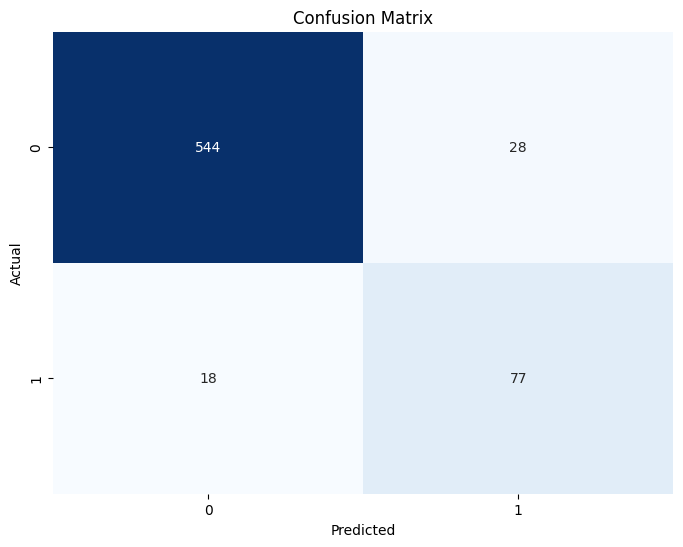

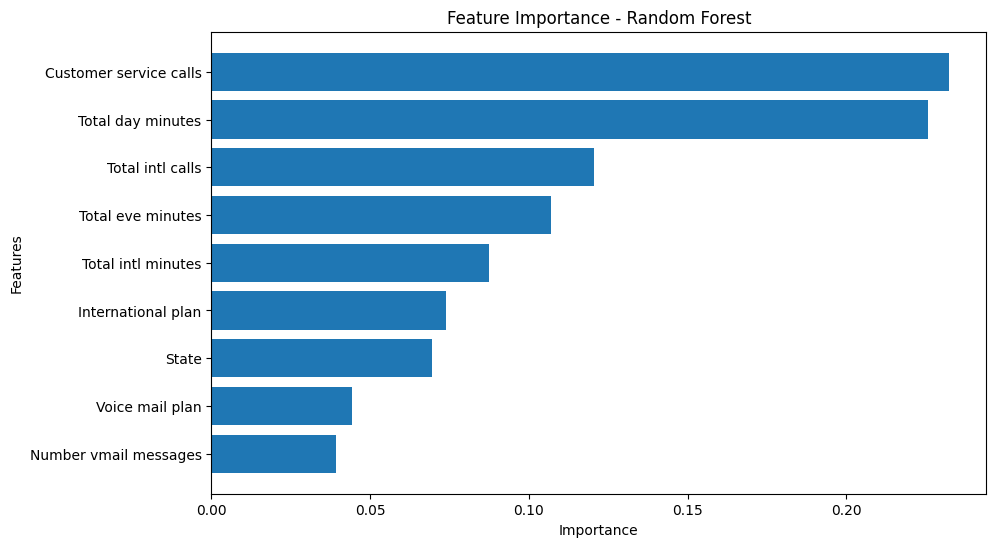

In [61]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report
import numpy as np
import matplotlib.pyplot as plt

# Train a Random Forest model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)  # Training the model on the training data

# Predict on the test set
yhat_rf = rf_clf.predict(X_test)

# Calculate confusion matrix
conf_matrix_rf = confusion_matrix(y_test, yhat_rf)

# Correctly classified instances
correctly_classified_rf = np.sum(np.diag(conf_matrix_rf))  # Diagonal elements (TP + TN)
incorrectly_classified_rf = np.sum(conf_matrix_rf) - correctly_classified_rf  # Total sum - correctly classified

print(f"Correctly classified instances: {correctly_classified_rf}")
print(f"Incorrectly classified instances: {incorrectly_classified_rf}")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_rf = accuracy_score(y_test, yhat_rf)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_rf = precision_score(y_test, yhat_rf, average='weighted')
recall_weighted_rf = recall_score(y_test, yhat_rf, average='weighted')
f1_weighted_rf = f1_score(y_test, yhat_rf, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_rf = roc_auc_score(y_test, rf_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("Random Forest - Weighted Average Metrics:")
print(f"Accuracy: {accuracy_rf}")
print(f"Precision (Weighted Avg): {precision_weighted_rf}")
print(f"Recall (Weighted Avg): {recall_weighted_rf}")
print(f"F1-Score (Weighted Avg): {f1_weighted_rf}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_rf}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report:")
print(classification_report(y_test, yhat_rf))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Feature Importance (Optional)
# Visualizing feature importance
feature_importance = rf_clf.feature_importances_
features = X_train.columns  # Make sure X_train has column names

# Sort the feature importance in descending order
sorted_idx = np.argsort(feature_importance)

plt.figure(figsize=(10, 6))
plt.barh(features[sorted_idx], feature_importance[sorted_idx])
plt.title("Feature Importance - Random Forest")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()


In [63]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest model
rf_clf = RandomForestClassifier(random_state=42)

# Define the hyperparameters for tuning
param_grid = {
    'n_estimators': [50, 100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 5],  # Minimum samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider for the best split
    'bootstrap': [True, False],  # Whether bootstrap samples are used when building trees
}

# Initialize GridSearchCV for hyperparameter tuning with cross-validation
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters from GridSearchCV
best_params = grid_search.best_params_
best_rf_model = grid_search.best_estimator_

# Print the best parameters
print(f"Best Hyperparameters for Random Forest: {best_params}")


Best Hyperparameters for Random Forest: {'bootstrap': False, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


Correctly classified instances: 623
Incorrectly classified instances: 44
Random Forest - Weighted Average Metrics:
Accuracy: 0.9340329835082459
Precision (Weighted Avg): 0.9352756400288973
Recall (Weighted Avg): 0.9340329835082459
F1-Score (Weighted Avg): 0.9345973242353321
ROC-AUC (Weighted Avg): 0.9147957305852042

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       572
           1       0.76      0.79      0.77        95

    accuracy                           0.93       667
   macro avg       0.86      0.87      0.87       667
weighted avg       0.94      0.93      0.93       667



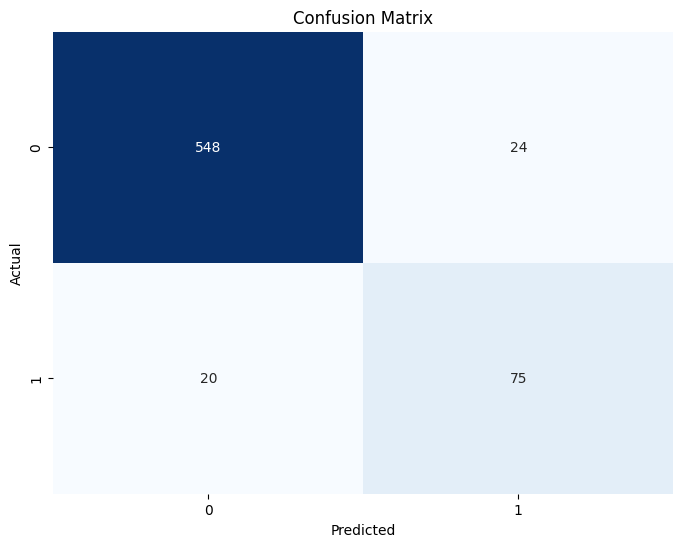

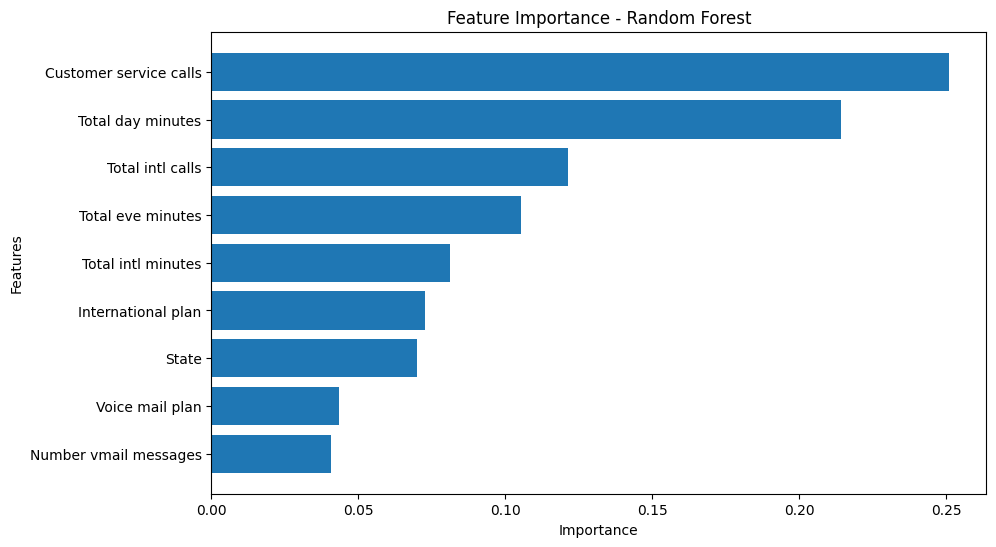

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report
import numpy as np
import matplotlib.pyplot as plt

# Best hyperparameters from GridSearchCV
best_params = {
    'bootstrap': False,
    'max_depth': 20,
    'max_features': 'sqrt',
    'min_samples_leaf': 1,  # Updated
    'min_samples_split': 2,  # Updated
    'n_estimators': 300  # Updated
}

# Initialize the Random Forest model with the best hyperparameters and class_weight='balanced'
rf_clf = RandomForestClassifier(random_state=42, **best_params)

# Train the model on the training data
rf_clf.fit(X_train, y_train)

# Predict on the test set
yhat_rf = rf_clf.predict(X_test)

# Calculate confusion matrix
conf_matrix_rf = confusion_matrix(y_test, yhat_rf)

# Correctly classified instances
correctly_classified_rf = np.sum(np.diag(conf_matrix_rf))  # Diagonal elements (TP + TN)
incorrectly_classified_rf = np.sum(conf_matrix_rf) - correctly_classified_rf  # Total sum - correctly classified

# Print classification results
print(f"Correctly classified instances: {correctly_classified_rf}")
print(f"Incorrectly classified instances: {incorrectly_classified_rf}")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_rf = accuracy_score(y_test, yhat_rf)
precision_weighted_rf = precision_score(y_test, yhat_rf, average='weighted')
recall_weighted_rf = recall_score(y_test, yhat_rf, average='weighted')
f1_weighted_rf = f1_score(y_test, yhat_rf, average='weighted')
roc_auc_weighted_rf = roc_auc_score(y_test, rf_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("Random Forest - Weighted Average Metrics:")
print(f"Accuracy: {accuracy_rf}")
print(f"Precision (Weighted Avg): {precision_weighted_rf}")
print(f"Recall (Weighted Avg): {recall_weighted_rf}")
print(f"F1-Score (Weighted Avg): {f1_weighted_rf}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_rf}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report:")
print(classification_report(y_test, yhat_rf))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
# Feature Importance (Optional)
# Visualizing feature importance
feature_importance = rf_clf.feature_importances_
features = X_train.columns  # Make sure X_train has column names

# Sort the feature importance in descending order
sorted_idx = np.argsort(feature_importance)

plt.figure(figsize=(10, 6))
plt.barh(features[sorted_idx], feature_importance[sorted_idx])
plt.title("Feature Importance - Random Forest")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()


XGBOOST


XGBoost Classifier:
Correctly classified instances: 634 (95.05%)
Incorrectly classified instances: 33 (4.95%)

Weighted Average Metrics for XGBoost:
Accuracy: 0.9505247376311844
Precision (Weighted Avg): 0.9491296660439743
Recall (Weighted Avg): 0.9505247376311844
F1-Score (Weighted Avg): 0.9494877847980698
ROC-AUC (Weighted Avg): 0.8968163415531837

Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       572
           1       0.86      0.78      0.82        95

    accuracy                           0.95       667
   macro avg       0.91      0.88      0.89       667
weighted avg       0.95      0.95      0.95       667



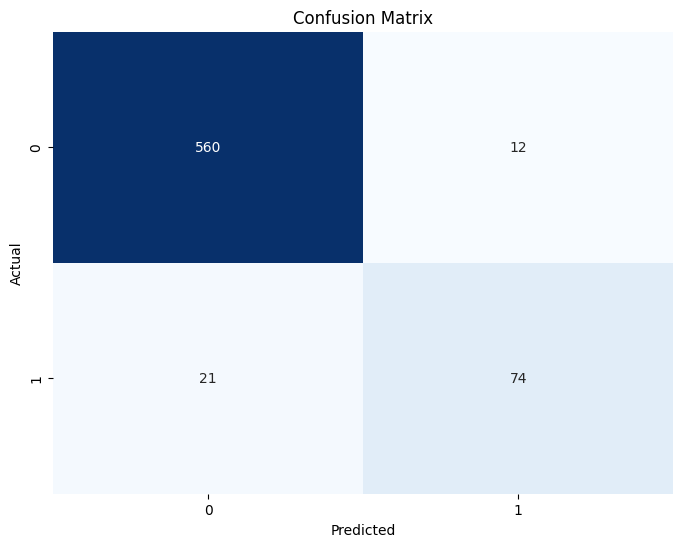

In [64]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the XGBoost Classifier
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Fit the XGBoost model
xgb_clf.fit(X_train, y_train)

# Prediction with the trained XGBoost model
yhat_xgb = xgb_clf.predict(X_test)

# Calculate confusion matrix for XGBoost
conf_matrix_xgb = confusion_matrix(y_test, yhat_xgb)

# Correctly classified instances for XGBoost
correctly_classified_xgb = np.sum(np.diag(conf_matrix_xgb))  # Diagonal elements (TP + TN)
incorrectly_classified_xgb = np.sum(conf_matrix_xgb) - correctly_classified_xgb  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_xgb = (correctly_classified_xgb / total_instances) * 100
incorrectly_classified_percent_xgb = (incorrectly_classified_xgb / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nXGBoost Classifier:")
print(f"Correctly classified instances: {correctly_classified_xgb} ({correctly_classified_percent_xgb:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_xgb} ({incorrectly_classified_percent_xgb:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_xgb = accuracy_score(y_test, yhat_xgb)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_xgb = precision_score(y_test, yhat_xgb, average='weighted')
recall_weighted_xgb = recall_score(y_test, yhat_xgb, average='weighted')
f1_weighted_xgb = f1_score(y_test, yhat_xgb, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_xgb = roc_auc_score(y_test, xgb_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for XGBoost:")
print(f"Accuracy: {accuracy_xgb}")
print(f"Precision (Weighted Avg): {precision_weighted_xgb}")
print(f"Recall (Weighted Avg): {recall_weighted_xgb}")
print(f"F1-Score (Weighted Avg): {f1_weighted_xgb}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_xgb}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for XGBoost:")
print(classification_report(y_test, yhat_xgb))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Ensemble methods

ADABOOST


AdaBoost Classifier:
Correctly classified instances: 573 (85.91%)
Incorrectly classified instances: 94 (14.09%)

Weighted Average Metrics for AdaBoost:
Accuracy: 0.8590704647676162
Precision (Weighted Avg): 0.8815177005601116
Recall (Weighted Avg): 0.8590704647676162
F1-Score (Weighted Avg): 0.867607629582892
ROC-AUC (Weighted Avg): 0.854977916820022

Classification Report for AdaBoost:
              precision    recall  f1-score   support

           0       0.94      0.89      0.92       572
           1       0.50      0.68      0.58        95

    accuracy                           0.86       667
   macro avg       0.72      0.79      0.75       667
weighted avg       0.88      0.86      0.87       667



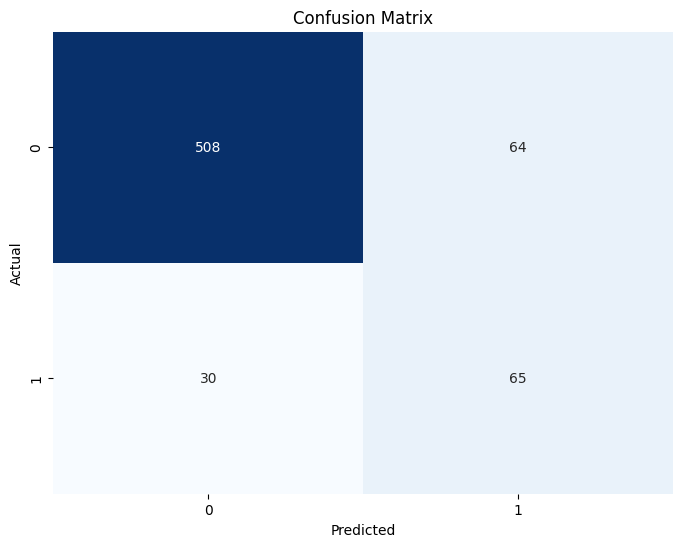

In [87]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the AdaBoost Classifier
ada_clf = AdaBoostClassifier(n_estimators=100, random_state=42)

# Fit the AdaBoost model
ada_clf.fit(X_train, y_train)

# Prediction with the trained AdaBoost model
yhat_ada = ada_clf.predict(X_test)

# Calculate confusion matrix for AdaBoost
conf_matrix_ada = confusion_matrix(y_test, yhat_ada)

# Correctly classified instances for AdaBoost
correctly_classified_ada = np.sum(np.diag(conf_matrix_ada))  # Diagonal elements (TP + TN)
incorrectly_classified_ada = np.sum(conf_matrix_ada) - correctly_classified_ada  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_ada = (correctly_classified_ada / total_instances) * 100
incorrectly_classified_percent_ada = (incorrectly_classified_ada / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nAdaBoost Classifier:")
print(f"Correctly classified instances: {correctly_classified_ada} ({correctly_classified_percent_ada:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_ada} ({incorrectly_classified_percent_ada:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_ada = accuracy_score(y_test, yhat_ada)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_ada = precision_score(y_test, yhat_ada, average='weighted')
recall_weighted_ada = recall_score(y_test, yhat_ada, average='weighted')
f1_weighted_ada = f1_score(y_test, yhat_ada, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_ada = roc_auc_score(y_test, ada_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for AdaBoost:")
print(f"Accuracy: {accuracy_ada}")
print(f"Precision (Weighted Avg): {precision_weighted_ada}")
print(f"Recall (Weighted Avg): {recall_weighted_ada}")
print(f"F1-Score (Weighted Avg): {f1_weighted_ada}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_ada}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for AdaBoost:")
print(classification_report(y_test, yhat_ada))

# Confusion Matrix
# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_ada, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [90]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import AdaBoostClassifier
import numpy as np

# Initialize the AdaBoost Classifier
ada_clf = AdaBoostClassifier(random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 150, 200, 250],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5]
}

# Perform RandomizedSearchCV
random_search_ada = RandomizedSearchCV(estimator=ada_clf, param_distributions=param_dist, n_iter=10, cv=3, n_jobs=-1, scoring='accuracy', verbose=1)
random_search_ada.fit(X_train, y_train)

# Get the best hyperparameters
best_params_ada = random_search_ada.best_params_
print(f"Best Hyperparameters for AdaBoost: {best_params_ada}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Hyperparameters for AdaBoost: {'n_estimators': 250, 'learning_rate': 0.2}



AdaBoost Classifier (Tuned):
Correctly classified instances: 561 (84.11%)
Incorrectly classified instances: 106 (15.89%)

Weighted Average Metrics for AdaBoost (Tuned):
Accuracy: 0.841079460269865
Precision (Weighted Avg): 0.8820488108017452
Recall (Weighted Avg): 0.841079460269865
F1-Score (Weighted Avg): 0.855078110155826
ROC-AUC (Weighted Avg): 0.8477272727272727

Classification Report for AdaBoost (Tuned):
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       572
           1       0.46      0.74      0.57        95

    accuracy                           0.84       667
   macro avg       0.71      0.80      0.74       667
weighted avg       0.88      0.84      0.86       667



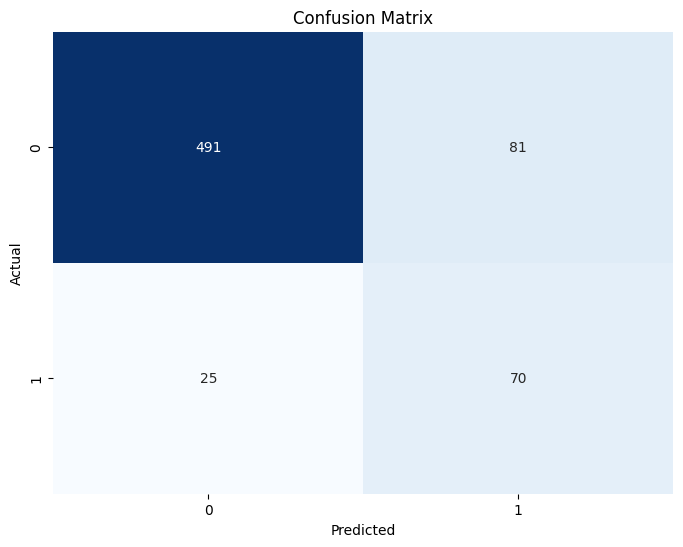

In [92]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np
from sklearn.ensemble import AdaBoostClassifier

# Initialize the AdaBoost Classifier with the best hyperparameters from GridSearchCV
ada_clf_tuned = AdaBoostClassifier(**best_params_ada, random_state=42)

# Fit the AdaBoost model
ada_clf_tuned.fit(X_train, y_train)

# Prediction with the trained AdaBoost model
yhat_ada = ada_clf_tuned.predict(X_test)

# Calculate confusion matrix for AdaBoost
conf_matrix_ada = confusion_matrix(y_test, yhat_ada)

# Correctly classified instances for AdaBoost
correctly_classified_ada = np.sum(np.diag(conf_matrix_ada))  # Diagonal elements (TP + TN)
incorrectly_classified_ada = np.sum(conf_matrix_ada) - correctly_classified_ada  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_ada = (correctly_classified_ada / total_instances) * 100
incorrectly_classified_percent_ada = (incorrectly_classified_ada / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nAdaBoost Classifier (Tuned):")
print(f"Correctly classified instances: {correctly_classified_ada} ({correctly_classified_percent_ada:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_ada} ({incorrectly_classified_percent_ada:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_ada = accuracy_score(y_test, yhat_ada)
precision_weighted_ada = precision_score(y_test, yhat_ada, average='weighted')
recall_weighted_ada = recall_score(y_test, yhat_ada, average='weighted')
f1_weighted_ada = f1_score(y_test, yhat_ada, average='weighted')
roc_auc_weighted_ada = roc_auc_score(y_test, ada_clf_tuned.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for AdaBoost (Tuned):")
print(f"Accuracy: {accuracy_ada}")
print(f"Precision (Weighted Avg): {precision_weighted_ada}")
print(f"Recall (Weighted Avg): {recall_weighted_ada}")
print(f"F1-Score (Weighted Avg): {f1_weighted_ada}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_ada}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for AdaBoost (Tuned):")
print(classification_report(y_test, yhat_ada))

# Confusion Matrix
# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_ada, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Bagging


Bagging Classifier:
Correctly classified instances: 621 (93.10%)
Incorrectly classified instances: 46 (6.90%)

Weighted Average Metrics for Bagging:
Accuracy: 0.9310344827586207
Precision (Weighted Avg): 0.93377448850456
Recall (Weighted Avg): 0.9310344827586207
F1-Score (Weighted Avg): 0.9321848892028592
ROC-AUC (Weighted Avg): 0.9154858299595142

Classification Report for Bagging:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       572
           1       0.74      0.80      0.77        95

    accuracy                           0.93       667
   macro avg       0.85      0.88      0.86       667
weighted avg       0.93      0.93      0.93       667



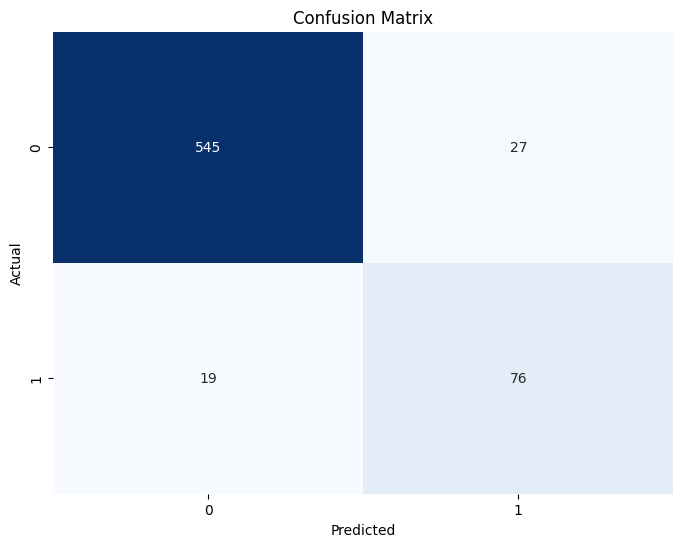

In [93]:
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the Bagging Classifier
bagging_clf = BaggingClassifier(n_estimators=100, random_state=42)

# Fit the Bagging model
bagging_clf.fit(X_train, y_train)

# Prediction with the trained Bagging model
yhat_bagging = bagging_clf.predict(X_test)

# Calculate confusion matrix for Bagging
conf_matrix_bagging = confusion_matrix(y_test, yhat_bagging)

# Correctly classified instances for Bagging
correctly_classified_bagging = np.sum(np.diag(conf_matrix_bagging))  # Diagonal elements (TP + TN)
incorrectly_classified_bagging = np.sum(conf_matrix_bagging) - correctly_classified_bagging  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_bagging = (correctly_classified_bagging / total_instances) * 100
incorrectly_classified_percent_bagging = (incorrectly_classified_bagging / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nBagging Classifier:")
print(f"Correctly classified instances: {correctly_classified_bagging} ({correctly_classified_percent_bagging:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_bagging} ({incorrectly_classified_percent_bagging:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_bagging = accuracy_score(y_test, yhat_bagging)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_bagging = precision_score(y_test, yhat_bagging, average='weighted')
recall_weighted_bagging = recall_score(y_test, yhat_bagging, average='weighted')
f1_weighted_bagging = f1_score(y_test, yhat_bagging, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_bagging = roc_auc_score(y_test, bagging_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Bagging:")
print(f"Accuracy: {accuracy_bagging}")
print(f"Precision (Weighted Avg): {precision_weighted_bagging}")
print(f"Recall (Weighted Avg): {recall_weighted_bagging}")
print(f"F1-Score (Weighted Avg): {f1_weighted_bagging}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_bagging}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Bagging:")
print(classification_report(y_test, yhat_bagging))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_bagging, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [94]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier

# Initialize the Bagging Classifier
bagging_clf = BaggingClassifier(random_state=42)

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_samples': [0.5, 0.8, 1.0],
    'max_features': [0.5, 0.8, 1.0],
    'bootstrap': [True, False]
}

# Perform GridSearchCV
grid_search_bagging = GridSearchCV(estimator=bagging_clf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='accuracy')
grid_search_bagging.fit(X_train, y_train)

# Get the best hyperparameters
best_params_bagging = grid_search_bagging.best_params_
print(f"Best Hyperparameters for Bagging: {best_params_bagging}")


Best Hyperparameters for Bagging: {'bootstrap': False, 'max_features': 0.8, 'max_samples': 0.8, 'n_estimators': 150}



Bagging Classifier (Tuned):
Correctly classified instances: 624 (93.55%)
Incorrectly classified instances: 43 (6.45%)

Weighted Average Metrics for Bagging (Tuned):
Accuracy: 0.9355322338830585
Precision (Weighted Avg): 0.9334687917619063
Recall (Weighted Avg): 0.9355322338830585
F1-Score (Weighted Avg): 0.934181052918697
ROC-AUC (Weighted Avg): 0.9008925285241074

Classification Report for Bagging (Tuned):
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       572
           1       0.80      0.73      0.76        95

    accuracy                           0.94       667
   macro avg       0.88      0.85      0.86       667
weighted avg       0.93      0.94      0.93       667



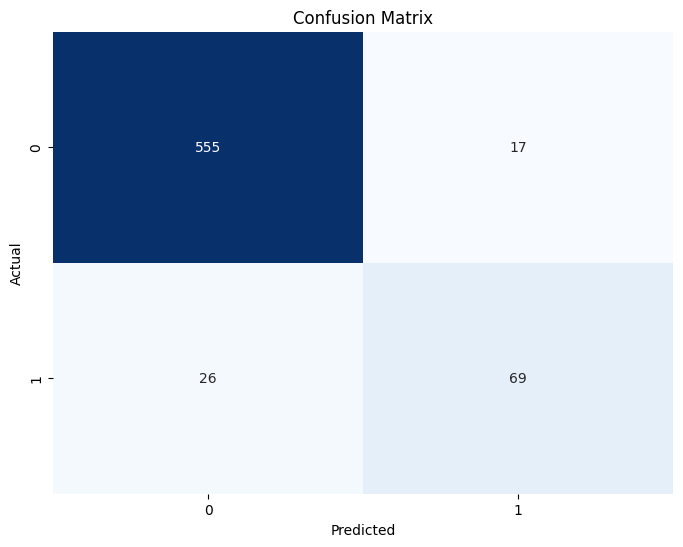

In [96]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np
from sklearn.ensemble import BaggingClassifier

# Initialize the Bagging Classifier with the best hyperparameters from GridSearchCV
bagging_clf_tuned = BaggingClassifier(**best_params_bagging, random_state=42)

# Fit the Bagging model
bagging_clf_tuned.fit(X_train, y_train)

# Prediction with the trained Bagging model
yhat_bagging = bagging_clf_tuned.predict(X_test)

# Calculate confusion matrix for Bagging
conf_matrix_bagging = confusion_matrix(y_test, yhat_bagging)

# Correctly classified instances for Bagging
correctly_classified_bagging = np.sum(np.diag(conf_matrix_bagging))  # Diagonal elements (TP + TN)
incorrectly_classified_bagging = np.sum(conf_matrix_bagging) - correctly_classified_bagging  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_bagging = (correctly_classified_bagging / total_instances) * 100
incorrectly_classified_percent_bagging = (incorrectly_classified_bagging / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nBagging Classifier (Tuned):")
print(f"Correctly classified instances: {correctly_classified_bagging} ({correctly_classified_percent_bagging:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_bagging} ({incorrectly_classified_percent_bagging:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_bagging = accuracy_score(y_test, yhat_bagging)
precision_weighted_bagging = precision_score(y_test, yhat_bagging, average='weighted')
recall_weighted_bagging = recall_score(y_test, yhat_bagging, average='weighted')
f1_weighted_bagging = f1_score(y_test, yhat_bagging, average='weighted')
roc_auc_weighted_bagging = roc_auc_score(y_test, bagging_clf_tuned.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Bagging (Tuned):")
print(f"Accuracy: {accuracy_bagging}")
print(f"Precision (Weighted Avg): {precision_weighted_bagging}")
print(f"Recall (Weighted Avg): {recall_weighted_bagging}")
print(f"F1-Score (Weighted Avg): {f1_weighted_bagging}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_bagging}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Bagging (Tuned):")
print(classification_report(y_test, yhat_bagging))

# Confusion Matrix
# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_bagging, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Voting classifier


Voting Classifier:
Correctly classified instances: 607 (91.00%)
Incorrectly classified instances: 60 (9.00%)

Weighted Average Metrics for Voting Classifier:
Accuracy: 0.9100449775112444
Precision (Weighted Avg): 0.9215626192914708
Recall (Weighted Avg): 0.9100449775112444
F1-Score (Weighted Avg): 0.9141253805673933
ROC-AUC (Weighted Avg): 0.9085204269414796

Classification Report for Voting Classifier:
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       572
           1       0.65      0.81      0.72        95

    accuracy                           0.91       667
   macro avg       0.81      0.87      0.83       667
weighted avg       0.92      0.91      0.91       667



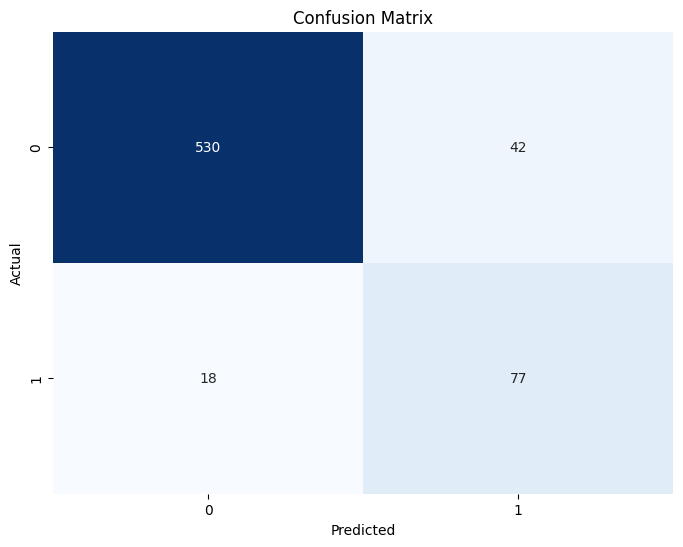

In [97]:
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the base classifiers
dt_clf = DecisionTreeClassifier(random_state=42)
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Initialize the Voting Classifier with soft voting (using probabilities)
voting_clf = VotingClassifier(estimators=[('dt', dt_clf), ('rf', rf_clf), ('lr', lr_clf)], voting='soft')

# Fit the Voting Classifier model
voting_clf.fit(X_train, y_train)

# Prediction with the trained Voting Classifier
yhat_voting = voting_clf.predict(X_test)

# Calculate confusion matrix for Voting Classifier
conf_matrix_voting = confusion_matrix(y_test, yhat_voting)

# Correctly classified instances for Voting Classifier
correctly_classified_voting = np.sum(np.diag(conf_matrix_voting))  # Diagonal elements (TP + TN)
incorrectly_classified_voting = np.sum(conf_matrix_voting) - correctly_classified_voting  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_voting = (correctly_classified_voting / total_instances) * 100
incorrectly_classified_percent_voting = (incorrectly_classified_voting / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nVoting Classifier:")
print(f"Correctly classified instances: {correctly_classified_voting} ({correctly_classified_percent_voting:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_voting} ({incorrectly_classified_percent_voting:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_voting = accuracy_score(y_test, yhat_voting)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_voting = precision_score(y_test, yhat_voting, average='weighted')
recall_weighted_voting = recall_score(y_test, yhat_voting, average='weighted')
f1_weighted_voting = f1_score(y_test, yhat_voting, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_voting = roc_auc_score(y_test, voting_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Voting Classifier:")
print(f"Accuracy: {accuracy_voting}")
print(f"Precision (Weighted Avg): {precision_weighted_voting}")
print(f"Recall (Weighted Avg): {recall_weighted_voting}")
print(f"F1-Score (Weighted Avg): {f1_weighted_voting}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_voting}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Voting Classifier:")
print(classification_report(y_test, yhat_voting))

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_voting, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [98]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier

# Initialize the base classifiers
dt_clf = DecisionTreeClassifier(random_state=42)
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Define the hyperparameter grid for each base classifier
param_grid_dt = {
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 10],
}

param_grid_rf = {
    'n_estimators': [50, 100, 150],
    'max_features': ['auto', 'sqrt'],
}

param_grid_lr = {
    'C': [0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear'],
}

# Perform GridSearchCV for each base classifier
grid_search_dt = GridSearchCV(estimator=dt_clf, param_grid=param_grid_dt, cv=3, n_jobs=-1)
grid_search_rf = GridSearchCV(estimator=rf_clf, param_grid=param_grid_rf, cv=3, n_jobs=-1)
grid_search_lr = GridSearchCV(estimator=lr_clf, param_grid=param_grid_lr, cv=3, n_jobs=-1)

# Fit the grid searches
grid_search_dt.fit(X_train, y_train)
grid_search_rf.fit(X_train, y_train)
grid_search_lr.fit(X_train, y_train)

# Get the best hyperparameters
best_params_dt = grid_search_dt.best_params_
best_params_rf = grid_search_rf.best_params_
best_params_lr = grid_search_lr.best_params_

print(f"Best Hyperparameters for Decision Tree: {best_params_dt}")
print(f"Best Hyperparameters for Random Forest: {best_params_rf}")
print(f"Best Hyperparameters for Logistic Regression: {best_params_lr}")


Best Hyperparameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 2}
Best Hyperparameters for Random Forest: {'max_features': 'sqrt', 'n_estimators': 150}
Best Hyperparameters for Logistic Regression: {'C': 0.1, 'solver': 'lbfgs'}


In [99]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Initialize the base classifiers with the best hyperparameters from GridSearchCV
dt_clf_tuned = DecisionTreeClassifier(random_state=42, **best_params_dt)
rf_clf_tuned = RandomForestClassifier(random_state=42, **best_params_rf)
lr_clf_tuned = LogisticRegression(random_state=42, **best_params_lr)

# Initialize the Voting Classifier with soft voting (using probabilities)
voting_clf_tuned = VotingClassifier(estimators=[('dt', dt_clf_tuned), ('rf', rf_clf_tuned), ('lr', lr_clf_tuned)], voting='soft')

# Fit the Voting Classifier model
voting_clf_tuned.fit(X_train, y_train)

# Prediction with the trained Voting Classifier
yhat_voting = voting_clf_tuned.predict(X_test)

# Calculate confusion matrix for Voting Classifier
conf_matrix_voting = confusion_matrix(y_test, yhat_voting)

# Correctly classified instances for Voting Classifier
correctly_classified_voting = np.sum(np.diag(conf_matrix_voting))  # Diagonal elements (TP + TN)
incorrectly_classified_voting = np.sum(conf_matrix_voting) - correctly_classified_voting  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_voting = (correctly_classified_voting / total_instances) * 100
incorrectly_classified_percent_voting = (incorrectly_classified_voting / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nVoting Classifier (Tuned):")
print(f"Correctly classified instances: {correctly_classified_voting} ({correctly_classified_percent_voting:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_voting} ({incorrectly_classified_percent_voting:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_voting = accuracy_score(y_test, yhat_voting)
precision_weighted_voting = precision_score(y_test, yhat_voting, average='weighted')
recall_weighted_voting = recall_score(y_test, yhat_voting, average='weighted')
f1_weighted_voting = f1_score(y_test, yhat_voting, average='weighted')
roc_auc_weighted_voting = roc_auc_score(y_test, voting_clf_tuned.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Voting Classifier (Tuned):")
print(f"Accuracy: {accuracy_voting}")
print(f"Precision (Weighted Avg): {precision_weighted_voting}")
print(f"Recall (Weighted Avg): {recall_weighted_voting}")
print(f"F1-Score (Weighted Avg): {f1_weighted_voting}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_voting}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Voting Classifier (Tuned):")
print(classification_report(y_test, yhat_voting))

# Confusion Matrix
print("\nConfusion Matrix for Voting Classifier (Tuned):")
print(conf_matrix_voting)



Voting Classifier (Tuned):
Correctly classified instances: 606 (90.85%)
Incorrectly classified instances: 61 (9.15%)

Weighted Average Metrics for Voting Classifier (Tuned):
Accuracy: 0.9085457271364318
Precision (Weighted Avg): 0.9196258590164027
Recall (Weighted Avg): 0.9085457271364318
F1-Score (Weighted Avg): 0.9125451974167456
ROC-AUC (Weighted Avg): 0.9075450864924549

Classification Report for Voting Classifier (Tuned):
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       572
           1       0.64      0.80      0.71        95

    accuracy                           0.91       667
   macro avg       0.80      0.86      0.83       667
weighted avg       0.92      0.91      0.91       667


Confusion Matrix for Voting Classifier (Tuned):
[[530  42]
 [ 19  76]]


Bayesian Models


Gaussian


Naive Bayes Classifier (GaussianNB):
Correctly classified instances: 428 (64.17%)
Incorrectly classified instances: 239 (35.83%)

Weighted Average Metrics for Naive Bayes:
Accuracy: 0.6416791604197901
Precision (Weighted Avg): 0.8323305124846214
Recall (Weighted Avg): 0.6416791604197901
F1-Score (Weighted Avg): 0.6955032598403613
ROC-AUC (Weighted Avg): 0.7554287817445712

Classification Report for Naive Bayes:
              precision    recall  f1-score   support

           0       0.93      0.63      0.75       572
           1       0.24      0.72      0.36        95

    accuracy                           0.64       667
   macro avg       0.59      0.67      0.56       667
weighted avg       0.83      0.64      0.70       667



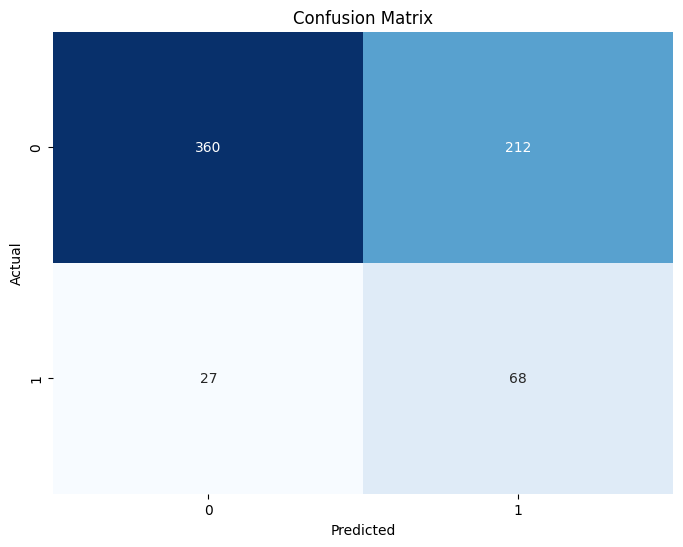

In [101]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the Gaussian Naive Bayes Model
gnb = GaussianNB()

# Fit the Gaussian Naive Bayes model
gnb.fit(X_train, y_train)

# Prediction with the trained Naive Bayes model
yhat_gnb = gnb.predict(X_test)

# Calculate confusion matrix for Naive Bayes
conf_matrix_gnb = confusion_matrix(y_test, yhat_gnb)

# Correctly classified instances for Naive Bayes
correctly_classified_gnb = np.sum(np.diag(conf_matrix_gnb))  # Diagonal elements (TP + TN)
incorrectly_classified_gnb = np.sum(conf_matrix_gnb) - correctly_classified_gnb  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_gnb = (correctly_classified_gnb / total_instances) * 100
incorrectly_classified_percent_gnb = (incorrectly_classified_gnb / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nNaive Bayes Classifier (GaussianNB):")
print(f"Correctly classified instances: {correctly_classified_gnb} ({correctly_classified_percent_gnb:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_gnb} ({incorrectly_classified_percent_gnb:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_gnb = accuracy_score(y_test, yhat_gnb)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_gnb = precision_score(y_test, yhat_gnb, average='weighted')
recall_weighted_gnb = recall_score(y_test, yhat_gnb, average='weighted')
f1_weighted_gnb = f1_score(y_test, yhat_gnb, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_gnb = roc_auc_score(y_test, gnb.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Naive Bayes:")
print(f"Accuracy: {accuracy_gnb}")
print(f"Precision (Weighted Avg): {precision_weighted_gnb}")
print(f"Recall (Weighted Avg): {recall_weighted_gnb}")
print(f"F1-Score (Weighted Avg): {f1_weighted_gnb}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_gnb}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Naive Bayes:")
print(classification_report(y_test, yhat_gnb))

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gnb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [102]:
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB

# Initialize the Gaussian Naive Bayes Model
gnb = GaussianNB()

# Define the hyperparameter grid
param_grid = {
    'var_smoothing': np.logspace(0, -9, num=100)
}

# Perform GridSearchCV
grid_search_gnb = GridSearchCV(gnb, param_grid, cv=5, n_jobs=-1)
grid_search_gnb.fit(X_train, y_train)

# Get the best hyperparameters
best_params_gnb = grid_search_gnb.best_params_

print(f"Best Hyperparameters for Naive Bayes (GaussianNB): {best_params_gnb}")


Best Hyperparameters for Naive Bayes (GaussianNB): {'var_smoothing': np.float64(1.873817422860383e-07)}



Naive Bayes Classifier (GaussianNB):
Correctly classified instances: 428 (64.17%)
Incorrectly classified instances: 239 (35.83%)

Weighted Average Metrics for Naive Bayes:
Accuracy: 0.6416791604197901
Precision (Weighted Avg): 0.8323305124846214
Recall (Weighted Avg): 0.6416791604197901
F1-Score (Weighted Avg): 0.6955032598403613
ROC-AUC (Weighted Avg): 0.7555023923444977

Classification Report for Naive Bayes:
              precision    recall  f1-score   support

           0       0.93      0.63      0.75       572
           1       0.24      0.72      0.36        95

    accuracy                           0.64       667
   macro avg       0.59      0.67      0.56       667
weighted avg       0.83      0.64      0.70       667



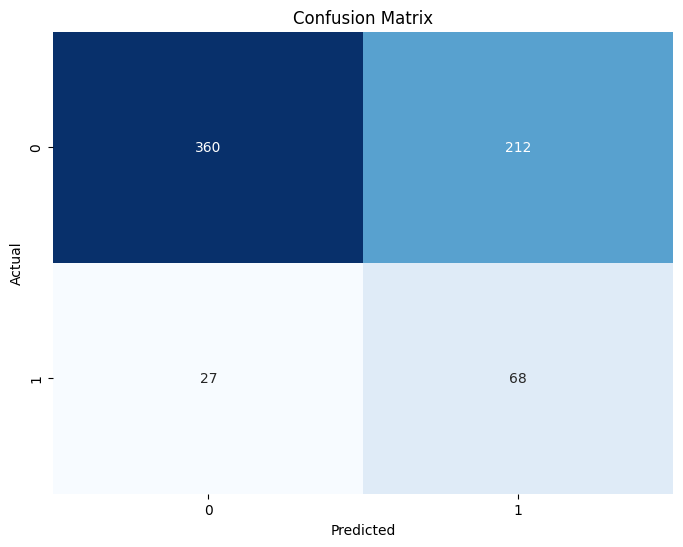

In [103]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the Gaussian Naive Bayes Model
gnb = GaussianNB(**best_params_gnb)  # You can also use best_params_gnb if performing hyperparameter tuning

# Fit the Gaussian Naive Bayes model
gnb.fit(X_train, y_train)

# Make predictions with the trained model
yhat_gnb = gnb.predict(X_test)

# Calculate confusion matrix for Naive Bayes
conf_matrix_gnb = confusion_matrix(y_test, yhat_gnb)

# Correctly classified instances for Naive Bayes
correctly_classified_gnb = np.sum(np.diag(conf_matrix_gnb))  # Diagonal elements (TP + TN)
incorrectly_classified_gnb = np.sum(conf_matrix_gnb) - correctly_classified_gnb  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_gnb = (correctly_classified_gnb / total_instances) * 100
incorrectly_classified_percent_gnb = (incorrectly_classified_gnb / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nNaive Bayes Classifier (GaussianNB):")
print(f"Correctly classified instances: {correctly_classified_gnb} ({correctly_classified_percent_gnb:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_gnb} ({incorrectly_classified_percent_gnb:.2f}%)")

# Calculate overall accuracy and metrics for each class (Churn=0 and Churn=1)
accuracy_gnb = accuracy_score(y_test, yhat_gnb)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_gnb = precision_score(y_test, yhat_gnb, average='weighted')
recall_weighted_gnb = recall_score(y_test, yhat_gnb, average='weighted')
f1_weighted_gnb = f1_score(y_test, yhat_gnb, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_gnb = roc_auc_score(y_test, gnb.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Naive Bayes:")
print(f"Accuracy: {accuracy_gnb}")
print(f"Precision (Weighted Avg): {precision_weighted_gnb}")
print(f"Recall (Weighted Avg): {recall_weighted_gnb}")
print(f"F1-Score (Weighted Avg): {f1_weighted_gnb}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_gnb}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Naive Bayes:")
print(classification_report(y_test, yhat_gnb))

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gnb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


GBM


Before Fine-Tuning - GBM Metrics:
Accuracy: 0.9190404797601199
Precision (Weighted Avg): 0.9257845314169669
Recall (Weighted Avg): 0.9190404797601199
F1-Score (Weighted Avg): 0.921610357803953
ROC-AUC (Weighted Avg): 0.9121457489878543

Classification Report for GBM:
              precision    recall  f1-score   support

           0       0.97      0.94      0.95       572
           1       0.68      0.80      0.74        95

    accuracy                           0.92       667
   macro avg       0.83      0.87      0.84       667
weighted avg       0.93      0.92      0.92       667


Confusion Matrix for GBM:


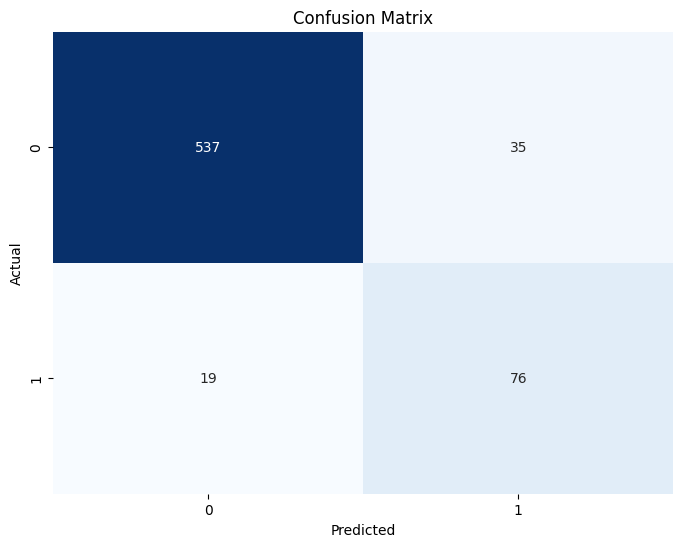

In [66]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

# Define the model
gbm_model = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Train the model
gbm_model.fit(X_train, y_train)

# Make predictions
yhat_gbm = gbm_model.predict(X_test)

# Evaluate the model
accuracy_gbm = accuracy_score(y_test, yhat_gbm)
precision_weighted_gbm = precision_score(y_test, yhat_gbm, average='weighted')
recall_weighted_gbm = recall_score(y_test, yhat_gbm, average='weighted')
f1_weighted_gbm = f1_score(y_test, yhat_gbm, average='weighted')
roc_auc_weighted_gbm = roc_auc_score(y_test, gbm_model.predict_proba(X_test)[:, 1]) if len(np.unique(y_test)) == 2 else "N/A (multi-class problem)"

# Print metrics
print("\nBefore Fine-Tuning - GBM Metrics:")
print(f"Accuracy: {accuracy_gbm}")
print(f"Precision (Weighted Avg): {precision_weighted_gbm}")
print(f"Recall (Weighted Avg): {recall_weighted_gbm}")
print(f"F1-Score (Weighted Avg): {f1_weighted_gbm}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_gbm}")

# Classification report and confusion matrix
print("\nClassification Report for GBM:")
print(classification_report(y_test, yhat_gbm))

print("\nConfusion Matrix for GBM:")
conf_matrix_gbm = confusion_matrix(y_test, yhat_gbm)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gbm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Hyperparameters for GBM: {'subsample': 0.9, 'n_estimators': 200, 'min_samples_split': 2, 'max_features': None, 'max_depth': 6, 'learning_rate': 0.1}

After Fine-Tuning - GBM Metrics:
Accuracy: 0.9505247376311844
Precision (Weighted Avg): 0.9496054976555627
Recall (Weighted Avg): 0.9505247376311844
F1-Score (Weighted Avg): 0.9499638015301854
ROC-AUC (Weighted Avg): 0.9066249539933751

Classification Report for Fine-Tuned GBM:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       572
           1       0.84      0.80      0.82        95

    accuracy                           0.95       667
   macro avg       0.91      0.89      0.90       667
weighted avg       0.95      0.95      0.95       667



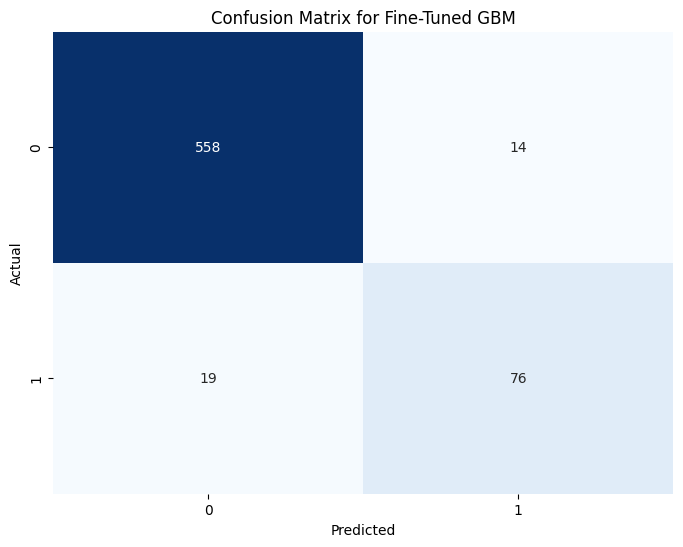

In [67]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the model
gbm_model = GradientBoostingClassifier(random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 150, 200, 250],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'max_features': ['auto', 'sqrt', 'log2', None]
}

# Perform RandomizedSearchCV
random_search_gbm = RandomizedSearchCV(estimator=gbm_model, param_distributions=param_dist, n_iter=10, cv=3, n_jobs=-1, scoring='accuracy', verbose=1)
random_search_gbm.fit(X_train, y_train)

# Get the best model
best_gbm_model = random_search_gbm.best_estimator_
best_params_gbm = random_search_gbm.best_params_
print(f"Best Hyperparameters for GBM: {best_params_gbm}")

# Train the best model
best_gbm_model.fit(X_train, y_train)

# Make predictions
yhat_gbm = best_gbm_model.predict(X_test)

# Evaluate the model
accuracy_gbm = accuracy_score(y_test, yhat_gbm)
precision_weighted_gbm = precision_score(y_test, yhat_gbm, average='weighted')
recall_weighted_gbm = recall_score(y_test, yhat_gbm, average='weighted')
f1_weighted_gbm = f1_score(y_test, yhat_gbm, average='weighted')
roc_auc_weighted_gbm = roc_auc_score(y_test, best_gbm_model.predict_proba(X_test)[:, 1]) if len(np.unique(y_test)) == 2 else "N/A (multi-class problem)"

# Print metrics after fine-tuning
print("\nAfter Fine-Tuning - GBM Metrics:")
print(f"Accuracy: {accuracy_gbm}")
print(f"Precision (Weighted Avg): {precision_weighted_gbm}")
print(f"Recall (Weighted Avg): {recall_weighted_gbm}")
print(f"F1-Score (Weighted Avg): {f1_weighted_gbm}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_gbm}")

# Classification report and confusion matrix
print("\nClassification Report for Fine-Tuned GBM:")
print(classification_report(y_test, yhat_gbm))

# Confusion Matrix
conf_matrix_gbm = confusion_matrix(y_test, yhat_gbm)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gbm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix for Fine-Tuned GBM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Support Vector Classifier (SVC)


Support Vector Classifier (SVC):
Correctly classified instances: 383 (57.42%)
Incorrectly classified instances: 284 (42.58%)

Weighted Average Metrics for SVC:
Accuracy: 0.5742128935532234
Precision (Weighted Avg): 0.8036045382778463
Recall (Weighted Avg): 0.5742128935532234
F1-Score (Weighted Avg): 0.637923649012932
ROC-AUC (Weighted Avg): 0.6552723592197276

Classification Report for SVC:
              precision    recall  f1-score   support

           0       0.90      0.56      0.69       572
           1       0.20      0.64      0.30        95

    accuracy                           0.57       667
   macro avg       0.55      0.60      0.50       667
weighted avg       0.80      0.57      0.64       667



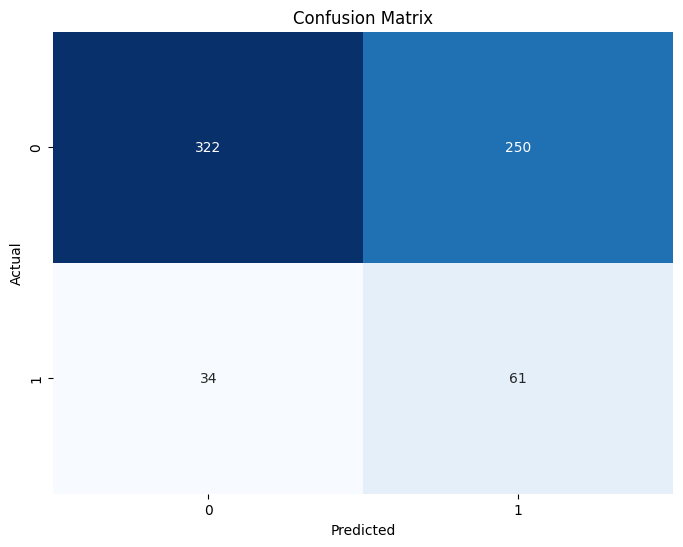

In [106]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Initialize the Support Vector Classifier (SVC) with RBF kernel
svc_clf = SVC(kernel='rbf', probability=True, random_state=42)

# Fit the SVC model
svc_clf.fit(X_train, y_train)

# Prediction with the trained SVC model
yhat_svc = svc_clf.predict(X_test)

# Calculate confusion matrix for SVC
conf_matrix_svc = confusion_matrix(y_test, yhat_svc)

# Correctly classified instances for SVC
correctly_classified_svc = np.sum(np.diag(conf_matrix_svc))  # Diagonal elements (TP + TN)
incorrectly_classified_svc = np.sum(conf_matrix_svc) - correctly_classified_svc  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_svc = (correctly_classified_svc / total_instances) * 100
incorrectly_classified_percent_svc = (incorrectly_classified_svc / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nSupport Vector Classifier (SVC):")
print(f"Correctly classified instances: {correctly_classified_svc} ({correctly_classified_percent_svc:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_svc} ({incorrectly_classified_percent_svc:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average

# Accuracy (overall for all instances)
accuracy_svc = accuracy_score(y_test, yhat_svc)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_svc = precision_score(y_test, yhat_svc, average='weighted')
recall_weighted_svc = recall_score(y_test, yhat_svc, average='weighted')
f1_weighted_svc = f1_score(y_test, yhat_svc, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class, i.e., Churn=1)
roc_auc_weighted_svc = roc_auc_score(y_test, svc_clf.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for SVC:")
print(f"Accuracy: {accuracy_svc}")
print(f"Precision (Weighted Avg): {precision_weighted_svc}")
print(f"Recall (Weighted Avg): {recall_weighted_svc}")
print(f"F1-Score (Weighted Avg): {f1_weighted_svc}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_svc}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for SVC:")
print(classification_report(y_test, yhat_svc))

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_svc, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Hyperparameters for SVC: {'tol': 1e-05, 'shrinking': False, 'kernel': 'rbf', 'gamma': 'auto', 'degree': 4, 'C': 10}

Support Vector Classifier (SVC):
Correctly classified instances: 512 (76.76%)
Incorrectly classified instances: 155 (23.24%)

Weighted Average Metrics for Fine-Tuned SVC:
Accuracy: 0.767616191904048
Precision (Weighted Avg): 0.8690077095690466
Recall (Weighted Avg): 0.767616191904048
F1-Score (Weighted Avg): 0.7982135829934858
ROC-AUC (Weighted Avg): 0.8351214574898785

Classification Report for Fine-Tuned SVC:
              precision    recall  f1-score   support

           0       0.95      0.77      0.85       572
           1       0.36      0.78      0.49        95

    accuracy                           0.77       667
   macro avg       0.66      0.77      0.67       667
weighted avg       0.87      0.77      0.80       667



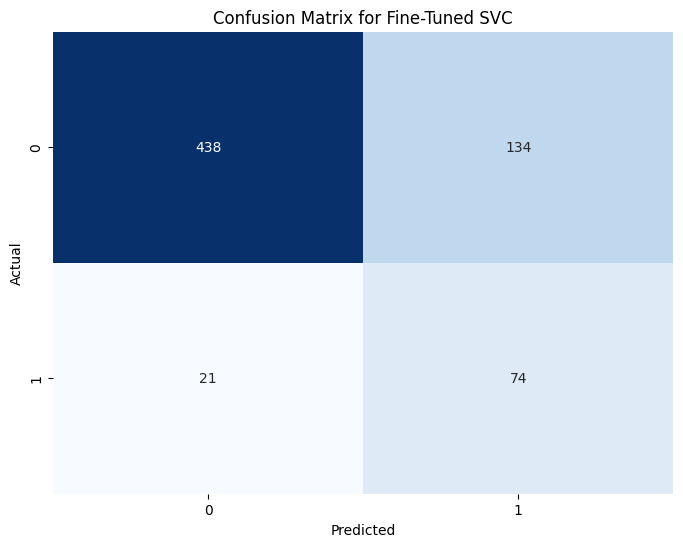

In [107]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the SVC model
svc_clf = SVC(probability=True, random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'C': [0.1, 1, 10, 100, 1000],  # Regularization parameter
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Types of kernel functions
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],  # Kernel coefficient for ‘rbf’, ‘poly’, and ‘sigmoid’
    'degree': [2, 3, 4],  # Degree of the polynomial kernel function (ignored if 'kernel' is not 'poly')
    'shrinking': [True, False],  # Whether to use shrinking heuristic
    'tol': [1e-3, 1e-4, 1e-5]  # Tolerance for stopping criterion
}

# Perform RandomizedSearchCV
random_search_svc = RandomizedSearchCV(estimator=svc_clf, param_distributions=param_dist, n_iter=10, cv=3, n_jobs=-1, scoring='accuracy', verbose=1)
random_search_svc.fit(X_train, y_train)

# Get the best model and parameters
best_svc_model = random_search_svc.best_estimator_
best_params_svc = random_search_svc.best_params_
print(f"Best Hyperparameters for SVC: {best_params_svc}")

# Train the best model
best_svc_model.fit(X_train, y_train)

# Make predictions
yhat_svc = best_svc_model.predict(X_test)

# Calculate confusion matrix for SVC
conf_matrix_svc = confusion_matrix(y_test, yhat_svc)

# Correctly classified instances for SVC
correctly_classified_svc = np.sum(np.diag(conf_matrix_svc))  # Diagonal elements (TP + TN)
incorrectly_classified_svc = np.sum(conf_matrix_svc) - correctly_classified_svc  # Total sum - correctly classified

# Calculate total instances
total_instances = len(y_test)

# Calculate percentages for correctly and incorrectly classified instances
correctly_classified_percent_svc = (correctly_classified_svc / total_instances) * 100
incorrectly_classified_percent_svc = (incorrectly_classified_svc / total_instances) * 100

# Print correctly and incorrectly classified instances with percentages
print(f"\nSupport Vector Classifier (SVC):")
print(f"Correctly classified instances: {correctly_classified_svc} ({correctly_classified_percent_svc:.2f}%)")
print(f"Incorrectly classified instances: {incorrectly_classified_svc} ({incorrectly_classified_percent_svc:.2f}%)")

# Calculate metrics for each class (Churn=0 and Churn=1) and for the weighted average
accuracy_svc = accuracy_score(y_test, yhat_svc)
precision_weighted_svc = precision_score(y_test, yhat_svc, average='weighted')
recall_weighted_svc = recall_score(y_test, yhat_svc, average='weighted')
f1_weighted_svc = f1_score(y_test, yhat_svc, average='weighted')

# ROC-AUC (for binary classification, use the probabilities of the positive class)
roc_auc_weighted_svc = roc_auc_score(y_test, best_svc_model.predict_proba(X_test)[:, 1])

# Print the metrics for the weighted average
print("\nWeighted Average Metrics for Fine-Tuned SVC:")
print(f"Accuracy: {accuracy_svc}")
print(f"Precision (Weighted Avg): {precision_weighted_svc}")
print(f"Recall (Weighted Avg): {recall_weighted_svc}")
print(f"F1-Score (Weighted Avg): {f1_weighted_svc}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_svc}")

# Print detailed classification report (includes precision, recall, f1-score, support for each class)
print("\nClassification Report for Fine-Tuned SVC:")
print(classification_report(y_test, yhat_svc))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_svc, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix for Fine-Tuned SVC')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


 Multi-Layer Perceptron (MLP)



Before Fine-Tuning - MLP Metrics:
Accuracy: 0.7856071964017991
Precision (Weighted Avg): 0.8900951671840008
Recall (Weighted Avg): 0.7856071964017991
F1-Score (Weighted Avg): 0.8144447122874745
ROC-AUC (Weighted Avg): 0.8223316157526684

Classification Report for MLP:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       572
           1       0.39      0.87      0.54        95

    accuracy                           0.79       667
   macro avg       0.68      0.82      0.70       667
weighted avg       0.89      0.79      0.81       667


Confusion Matrix for MLP:


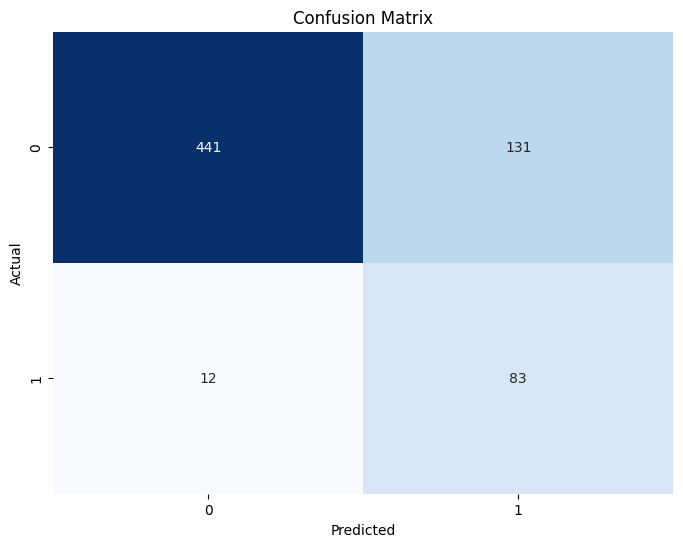

In [108]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

# Define the model
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

# Train the model
mlp_model.fit(X_train, y_train)

# Make predictions
yhat_mlp = mlp_model.predict(X_test)

# Evaluate the model
accuracy_mlp = accuracy_score(y_test, yhat_mlp)
precision_weighted_mlp = precision_score(y_test, yhat_mlp, average='weighted')
recall_weighted_mlp = recall_score(y_test, yhat_mlp, average='weighted')
f1_weighted_mlp = f1_score(y_test, yhat_mlp, average='weighted')
roc_auc_weighted_mlp = roc_auc_score(y_test, yhat_mlp)

# Print metrics
print("\nBefore Fine-Tuning - MLP Metrics:")
print(f"Accuracy: {accuracy_mlp}")
print(f"Precision (Weighted Avg): {precision_weighted_mlp}")
print(f"Recall (Weighted Avg): {recall_weighted_mlp}")
print(f"F1-Score (Weighted Avg): {f1_weighted_mlp}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_mlp}")

# Classification report and confusion matrix
print("\nClassification Report for MLP:")
print(classification_report(y_test, yhat_mlp))

print("\nConfusion Matrix for MLP:")
conf_matrix_mlp = confusion_matrix(y_test, yhat_mlp)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_mlp, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()



After Fine-Tuning - MLP Metrics:
Accuracy: 0.8125937031484258
Precision (Weighted Avg): 0.8869902450692703
Recall (Weighted Avg): 0.8125937031484258
F1-Score (Weighted Avg): 0.8348410479088912
ROC-AUC (Weighted Avg): 0.8161207213838793

Classification Report for MLP (Tuned):
              precision    recall  f1-score   support

           0       0.96      0.81      0.88       572
           1       0.42      0.82      0.56        95

    accuracy                           0.81       667
   macro avg       0.69      0.82      0.72       667
weighted avg       0.89      0.81      0.83       667


Confusion Matrix for MLP (Tuned):


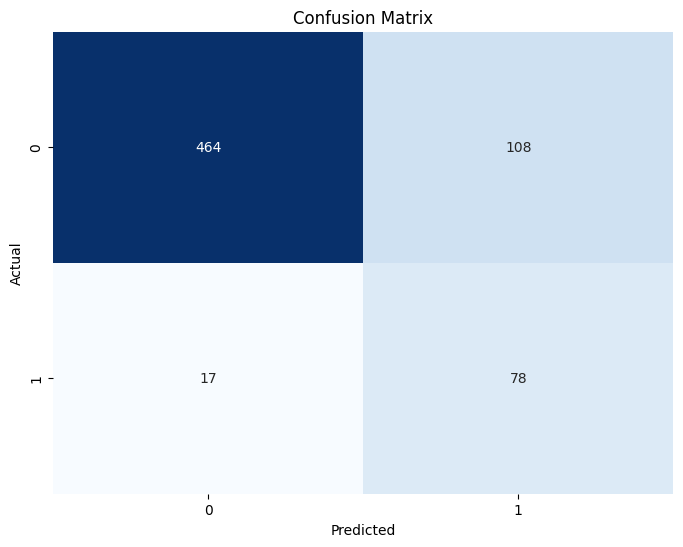

In [110]:
from sklearn.model_selection import GridSearchCV

# Hyperparameter tuning for MLP using GridSearchCV
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (150,)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'learning_rate': ['constant', 'invscaling', 'adaptive']
}

# Perform GridSearchCV
grid_search = GridSearchCV(MLPClassifier(max_iter=300, random_state=42), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best model
best_mlp_model = grid_search.best_estimator_

# Evaluate the model
yhat_mlp_tuned = best_mlp_model.predict(X_test)

# Print metrics
accuracy_mlp_tuned = accuracy_score(y_test, yhat_mlp_tuned)
precision_weighted_mlp_tuned = precision_score(y_test, yhat_mlp_tuned, average='weighted')
recall_weighted_mlp_tuned = recall_score(y_test, yhat_mlp_tuned, average='weighted')
f1_weighted_mlp_tuned = f1_score(y_test, yhat_mlp_tuned, average='weighted')
roc_auc_weighted_mlp_tuned = roc_auc_score(y_test, yhat_mlp_tuned)

print("\nAfter Fine-Tuning - MLP Metrics:")
print(f"Accuracy: {accuracy_mlp_tuned}")
print(f"Precision (Weighted Avg): {precision_weighted_mlp_tuned}")
print(f"Recall (Weighted Avg): {recall_weighted_mlp_tuned}")
print(f"F1-Score (Weighted Avg): {f1_weighted_mlp_tuned}")
print(f"ROC-AUC (Weighted Avg): {roc_auc_weighted_mlp_tuned}")

# Classification report and confusion matrix for the tuned model
print("\nClassification Report for MLP (Tuned):")
print(classification_report(y_test, yhat_mlp_tuned))

print("\nConfusion Matrix for MLP (Tuned):")
conf_matrix_mlp_tuned = confusion_matrix(y_test, yhat_mlp_tuned)
# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_mlp_tuned, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Tabnet

epoch 0  | loss: 0.66891 |  0:00:00s
epoch 1  | loss: 0.54616 |  0:00:01s
epoch 2  | loss: 0.49824 |  0:00:01s
epoch 3  | loss: 0.47959 |  0:00:02s
epoch 4  | loss: 0.46669 |  0:00:03s
epoch 5  | loss: 0.4606  |  0:00:03s
epoch 6  | loss: 0.44417 |  0:00:04s
epoch 7  | loss: 0.43795 |  0:00:04s
epoch 8  | loss: 0.4382  |  0:00:05s
epoch 9  | loss: 0.43556 |  0:00:06s
epoch 10 | loss: 0.41915 |  0:00:06s
epoch 11 | loss: 0.42782 |  0:00:07s
epoch 12 | loss: 0.41693 |  0:00:08s
epoch 13 | loss: 0.39655 |  0:00:08s
epoch 14 | loss: 0.39213 |  0:00:09s
epoch 15 | loss: 0.38178 |  0:00:09s
epoch 16 | loss: 0.39473 |  0:00:10s
epoch 17 | loss: 0.37582 |  0:00:11s
epoch 18 | loss: 0.37678 |  0:00:11s
epoch 19 | loss: 0.38209 |  0:00:12s
epoch 20 | loss: 0.38207 |  0:00:12s
epoch 21 | loss: 0.37616 |  0:00:13s
epoch 22 | loss: 0.37657 |  0:00:14s
epoch 23 | loss: 0.36832 |  0:00:14s
epoch 24 | loss: 0.37264 |  0:00:15s
epoch 25 | loss: 0.36891 |  0:00:15s
epoch 26 | loss: 0.37871 |  0:00:16s
e

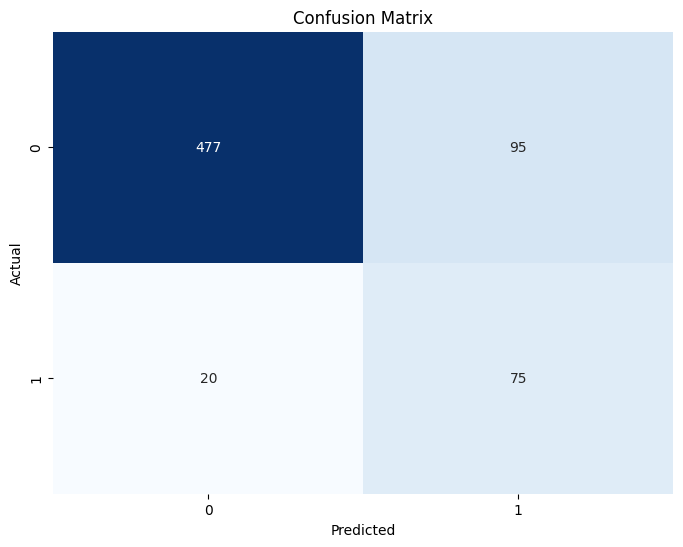

In [112]:
# Install the pytorch-tabnet library
# !pip install pytorch-tabnet

import numpy as np
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    f1_score, roc_auc_score, confusion_matrix, classification_report
)

# Assuming X_train, X_test, y_train, y_test are already prepared

# Convert data to NumPy arrays if needed
X_train_np = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_test_np = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test
y_train_np = y_train.to_numpy() if not isinstance(y_train, np.ndarray) else y_train
y_test_np = y_test.to_numpy() if not isinstance(y_test, np.ndarray) else y_test

# Initialize the TabNet model
tabnet_model = TabNetClassifier()

# Train the model
tabnet_model.fit(
    X_train_np, y_train_np,
    max_epochs=50,  # Maximum epochs
    patience=10,    # Early stopping patience
    batch_size=256,
    virtual_batch_size=64,
    num_workers=0,  # Data loader workers
    drop_last=False
)

# Predictions
yhat_tabnet = tabnet_model.predict(X_test_np)

# Evaluation Metrics
accuracy_tabnet = accuracy_score(y_test_np, yhat_tabnet)
precision_weighted_tabnet = precision_score(y_test_np, yhat_tabnet, average='weighted')
recall_weighted_tabnet = recall_score(y_test_np, yhat_tabnet, average='weighted')
f1_weighted_tabnet = f1_score(y_test_np, yhat_tabnet, average='weighted')

# If binary classification, calculate ROC-AUC
if len(np.unique(y_test_np)) == 2:
    roc_auc_tabnet = roc_auc_score(y_test_np, tabnet_model.predict_proba(X_test_np)[:, 1])
else:
    roc_auc_tabnet = "N/A (multi-class problem)"

classification_report_tabnet = classification_report(y_test_np, yhat_tabnet)
confusion_matrix_tabnet = confusion_matrix(y_test_np, yhat_tabnet)

# Print Results
print("TabNet Results:")
print(f"Accuracy: {accuracy_tabnet}")
print(f"Precision (Weighted Avg): {precision_weighted_tabnet}")
print(f"Recall (Weighted Avg): {recall_weighted_tabnet}")
print(f"F1-Score (Weighted Avg): {f1_weighted_tabnet}")
print(f"ROC-AUC: {roc_auc_tabnet}")
print("\nClassification Report:")
print(classification_report_tabnet)
print("\nConfusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix_tabnet, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [79]:
from sklearn.model_selection import GridSearchCV

# Example parameter grid
param_grid = {
    'n_d': [8, 16, 32],
    'n_a': [8, 16, 32],
    'n_steps': [3, 5],
    'gamma': [1.0, 1.3, 2.0],
    'lambda_sparse': [0.0001, 0.001],
}

# Custom TabNet model wrapper for GridSearchCV
class TabNetClassifierCV(TabNetClassifier):
    def set_params(self, **params):
        for param, value in params.items():
            setattr(self, param, value)
        return self

# Perform grid search
grid_search = GridSearchCV(
    estimator=TabNetClassifierCV(),
    param_grid=param_grid,
    scoring='f1_weighted',  # Adjust metric as needed
    cv=3,
    verbose=2
)
grid_search.fit(X_train_np, y_train_np)
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 108 candidates, totalling 324 fits
epoch 0  | loss: 0.55209 |  0:00:00s
epoch 1  | loss: 0.45042 |  0:00:00s
epoch 2  | loss: 0.43818 |  0:00:00s
epoch 3  | loss: 0.39508 |  0:00:00s
epoch 4  | loss: 0.39098 |  0:00:00s
epoch 5  | loss: 0.38675 |  0:00:00s
epoch 6  | loss: 0.34955 |  0:00:00s
epoch 7  | loss: 0.34705 |  0:00:00s
epoch 8  | loss: 0.36983 |  0:00:00s
epoch 9  | loss: 0.3501  |  0:00:00s
epoch 10 | loss: 0.33177 |  0:00:00s
epoch 11 | loss: 0.3115  |  0:00:00s
epoch 12 | loss: 0.3259  |  0:00:00s
epoch 13 | loss: 0.29066 |  0:00:00s
epoch 14 | loss: 0.27813 |  0:00:00s
epoch 15 | loss: 0.30757 |  0:00:00s
epoch 16 | loss: 0.31339 |  0:00:00s
epoch 17 | loss: 0.30196 |  0:00:00s
epoch 18 | loss: 0.29295 |  0:00:00s
epoch 19 | loss: 0.30375 |  0:00:01s
epoch 20 | loss: 0.29258 |  0:00:01s
epoch 21 | loss: 0.28058 |  0:00:01s
epoch 22 | loss: 0.26188 |  0:00:01s
epoch 23 | loss: 0.28935 |  0:00:01s
epoch 24 | loss: 0.25832 |  0:00:01s
epoch 25 | l

epoch 0  | loss: 0.65116 |  0:00:00s
epoch 1  | loss: 0.53113 |  0:00:01s
epoch 2  | loss: 0.477   |  0:00:02s
epoch 3  | loss: 0.43477 |  0:00:02s
epoch 4  | loss: 0.43635 |  0:00:03s
epoch 5  | loss: 0.41605 |  0:00:03s
epoch 6  | loss: 0.42649 |  0:00:04s
epoch 7  | loss: 0.42929 |  0:00:05s
epoch 8  | loss: 0.41651 |  0:00:05s
epoch 9  | loss: 0.40365 |  0:00:06s
epoch 10 | loss: 0.39887 |  0:00:06s
epoch 11 | loss: 0.38283 |  0:00:07s
epoch 12 | loss: 0.39877 |  0:00:07s
epoch 13 | loss: 0.38927 |  0:00:08s
epoch 14 | loss: 0.38609 |  0:00:09s
epoch 15 | loss: 0.38271 |  0:00:09s
epoch 16 | loss: 0.37745 |  0:00:10s
epoch 17 | loss: 0.37485 |  0:00:10s
epoch 18 | loss: 0.38654 |  0:00:11s
epoch 19 | loss: 0.3824  |  0:00:11s
epoch 20 | loss: 0.37768 |  0:00:12s
epoch 21 | loss: 0.36896 |  0:00:12s
epoch 22 | loss: 0.3667  |  0:00:13s
epoch 23 | loss: 0.37394 |  0:00:13s
epoch 24 | loss: 0.36337 |  0:00:14s
epoch 25 | loss: 0.35874 |  0:00:14s
epoch 26 | loss: 0.35855 |  0:00:15s
e

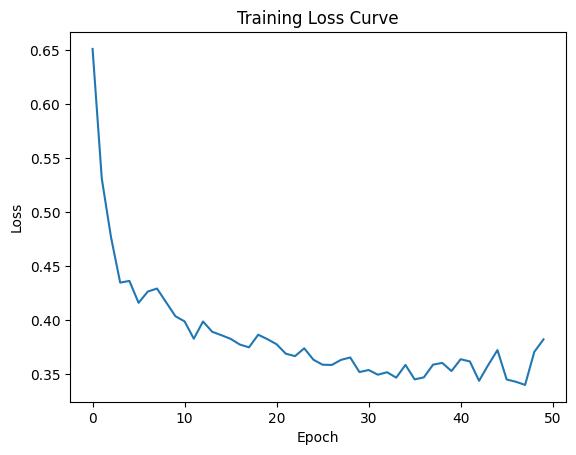

TabNet Results:
Accuracy: 0.9100449775112444
Precision (Weighted Avg): 0.9143755524373045
Recall (Weighted Avg): 0.9100449775112444
F1-Score (Weighted Avg): 0.9118972259901795
ROC-AUC: 0.8742362900257636

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       572
           1       0.67      0.74      0.70        95

    accuracy                           0.91       667
   macro avg       0.81      0.84      0.82       667
weighted avg       0.91      0.91      0.91       667


Confusion Matrix:
[[537  35]
 [ 25  70]]


In [210]:
# Install the pytorch-tabnet library
# !pip install pytorch-tabnet

import numpy as np
import matplotlib.pyplot as plt
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    f1_score, roc_auc_score, confusion_matrix, classification_report
)

# Assuming X_train, X_test, y_train, y_test are already prepared

# Convert data to NumPy arrays if needed
X_train_np = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_test_np = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test
y_train_np = y_train.to_numpy() if not isinstance(y_train, np.ndarray) else y_train
y_test_np = y_test.to_numpy() if not isinstance(y_test, np.ndarray) else y_test

# Initialize the TabNet model with the best parameters
tabnet_model = TabNetClassifier(
    gamma=2.0,
    lambda_sparse=0.0001,
    n_a=16,
    n_d=8,
    n_steps=3
)

# Train the model
tabnet_model.fit(
    X_train_np, y_train_np,
    max_epochs=50,  # Maximum epochs
    patience=10,    # Early stopping patience
    batch_size=256,
    virtual_batch_size=64,
    num_workers=0,  # Data loader workers
    drop_last=False
)

# Plot the loss curve
plt.plot(tabnet_model.history['loss'])
plt.title('Training Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

# Predictions
yhat_tabnet = tabnet_model.predict(X_test_np)

# Evaluation Metrics
accuracy_tabnet = accuracy_score(y_test_np, yhat_tabnet)
precision_weighted_tabnet = precision_score(y_test_np, yhat_tabnet, average='weighted')
recall_weighted_tabnet = recall_score(y_test_np, yhat_tabnet, average='weighted')
f1_weighted_tabnet = f1_score(y_test_np, yhat_tabnet, average='weighted')

# If binary classification, calculate ROC-AUC
if len(np.unique(y_test_np)) == 2:
    roc_auc_tabnet = roc_auc_score(y_test_np, tabnet_model.predict_proba(X_test_np)[:, 1])
else:
    roc_auc_tabnet = "N/A (multi-class problem)"

classification_report_tabnet = classification_report(y_test_np, yhat_tabnet)
confusion_matrix_tabnet = confusion_matrix(y_test_np, yhat_tabnet)

# Print Results
print("TabNet Results:")
print(f"Accuracy: {accuracy_tabnet}")
print(f"Precision (Weighted Avg): {precision_weighted_tabnet}")
print(f"Recall (Weighted Avg): {recall_weighted_tabnet}")
print(f"F1-Score (Weighted Avg): {f1_weighted_tabnet}")
print(f"ROC-AUC: {roc_auc_tabnet}")
print("\nClassification Report:")
print(classification_report_tabnet)
print("\nConfusion Matrix:")
print(confusion_matrix_tabnet)


Linear Regression 

Correctly classified instances: 491
Incorrectly classified instances: 176

Linear Regression - Weighted Average Metrics:
Accuracy: 0.7361319340329835
Precision (Weighted Avg): 0.8644761975023451
Recall (Weighted Avg): 0.7361319340329835
F1-Score (Weighted Avg): 0.773371275215445
Mean Squared Error (MSE): 0.19150512514377147
R-Squared (R2): -0.5678786091293215

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.73      0.83       572
           1       0.32      0.79      0.46        95

    accuracy                           0.74       667
   macro avg       0.64      0.76      0.64       667
weighted avg       0.86      0.74      0.77       667



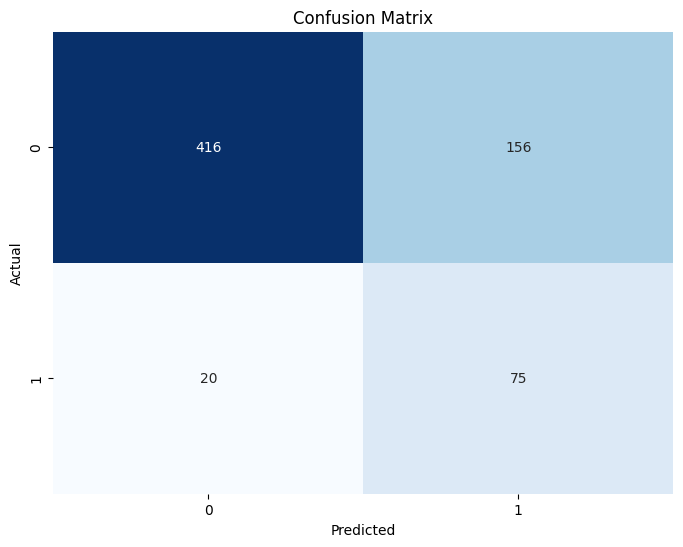

In [113]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt

# Initialize the Linear Regression model
lin_reg = LinearRegression()

# Fit the model to the training data
lin_reg.fit(X_train, y_train)

# Predict on the test set
yhat_lin_reg = lin_reg.predict(X_test)

# Since Linear Regression predicts continuous values, classify as 0 or 1 based on a threshold (e.g., 0.5)
yhat_classified = (yhat_lin_reg >= 0.5).astype(int)

# Calculate confusion matrix
conf_matrix_lr = confusion_matrix(y_test, yhat_classified)

# Correctly classified instances
correctly_classified_lr = np.sum(np.diag(conf_matrix_lr))  # Diagonal elements (TP + TN)
incorrectly_classified_lr = np.sum(conf_matrix_lr) - correctly_classified_lr  # Total sum - correctly classified

# Print classification results
print(f"Correctly classified instances: {correctly_classified_lr}")
print(f"Incorrectly classified instances: {incorrectly_classified_lr}")

# Accuracy (overall for all instances)
accuracy_lr = accuracy_score(y_test, yhat_classified)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_lr = precision_score(y_test, yhat_classified, average='weighted')
recall_weighted_lr = recall_score(y_test, yhat_classified, average='weighted')
f1_weighted_lr = f1_score(y_test, yhat_classified, average='weighted')

# Evaluate continuous regression performance
mse_lr = mean_squared_error(y_test, yhat_lin_reg)
r2_lr = r2_score(y_test, yhat_lin_reg)

# Print metrics
print("\nLinear Regression - Weighted Average Metrics:")
print(f"Accuracy: {accuracy_lr}")
print(f"Precision (Weighted Avg): {precision_weighted_lr}")
print(f"Recall (Weighted Avg): {recall_weighted_lr}")
print(f"F1-Score (Weighted Avg): {f1_weighted_lr}")
print(f"Mean Squared Error (MSE): {mse_lr}")
print(f"R-Squared (R2): {r2_lr}")

# Print detailed classification report (precision, recall, F1 for each class)
print("\nClassification Report:")
print(classification_report(y_test, yhat_classified))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_lr, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [84]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters for tuning
param_grid_ridge = {
    'alpha': [0.01, 0.1, 1, 10, 100]  # Regularization strength
}

# Initialize Ridge Regression
ridge_reg = Ridge()

# Perform GridSearchCV for hyperparameter tuning
grid_search_ridge = GridSearchCV(estimator=ridge_reg, 
                                 param_grid=param_grid_ridge, 
                                 scoring='neg_mean_squared_error', 
                                 cv=5, n_jobs=-1, verbose=2)
grid_search_ridge.fit(X_train, y_train)

# Get the best parameters
best_params_ridge = grid_search_ridge.best_params_
best_ridge_model = grid_search_ridge.best_estimator_

print(f"Best Hyperparameters for Ridge: {best_params_ridge}")

# Evaluate the best Ridge model
yhat_ridge = best_ridge_model.predict(X_test)
mse_ridge = mean_squared_error(y_test, yhat_ridge)
r2_ridge = r2_score(y_test, yhat_ridge)

print("\nRidge Regression Evaluation:")
print(f"Mean Squared Error (MSE): {mse_ridge}")
print(f"R-Squared (R2): {r2_ridge}")


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Hyperparameters for Ridge: {'alpha': 0.01}

Ridge Regression Evaluation:
Mean Squared Error (MSE): 0.18551486627523134
R-Squared (R2): -0.5188355418167352


In [ ]:
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt

# Best hyperparameter for Ridge (from previous tuning)
best_alpha = 0.01

# Initialize the Ridge Regression model with the best alpha
ridge_reg = Ridge(alpha=best_alpha)

# Fit the model to the training data
ridge_reg.fit(X_train, y_train)

# Predict on the test set
yhat_ridge = ridge_reg.predict(X_test)

# Classify predictions based on a threshold (e.g., 0.5)
yhat_classified = (yhat_ridge >= 0.5).astype(int)

# Calculate confusion matrix
conf_matrix_ridge = confusion_matrix(y_test, yhat_classified)

# Correctly classified instances
correctly_classified_ridge = np.sum(np.diag(conf_matrix_ridge))  # Diagonal elements (TP + TN)
incorrectly_classified_ridge = np.sum(conf_matrix_ridge) - correctly_classified_ridge  # Total sum - correctly classified

# Print classification results
print(f"Correctly classified instances: {correctly_classified_ridge}")
print(f"Incorrectly classified instances: {incorrectly_classified_ridge}")

# Accuracy (overall for all instances)
accuracy_ridge = accuracy_score(y_test, yhat_classified)

# Precision, Recall, F1-Score (Weighted Average)
precision_weighted_ridge = precision_score(y_test, yhat_classified, average='weighted')
recall_weighted_ridge = recall_score(y_test, yhat_classified, average='weighted')
f1_weighted_ridge = f1_score(y_test, yhat_classified, average='weighted')

# Evaluate continuous regression performance
mse_ridge = mean_squared_error(y_test, yhat_ridge)
r2_ridge = r2_score(y_test, yhat_ridge)

# Print metrics
print("\nRidge Regression - Weighted Average Metrics:")
print(f"Accuracy: {accuracy_ridge}")
print(f"Precision (Weighted Avg): {precision_weighted_ridge}")
print(f"Recall (Weighted Avg): {recall_weighted_ridge}")
print(f"F1-Score (Weighted Avg): {f1_weighted_ridge}")
print(f"Mean Squared Error (MSE): {mse_ridge}")
print(f"R-Squared (R2): {r2_ridge}")

# Print detailed classification report (precision, recall, F1 for each class)
print("\nClassification Report:")
print(classification_report(y_test, yhat_classified))

# Confusion Matrix
print("\nConfusion Matrix:")
print(conf_matrix_ridge)


Correctly classified instances: 491
Incorrectly classified instances: 176

Ridge Regression - Weighted Average Metrics:
Accuracy: 0.7361319340329835
Precision (Weighted Avg): 0.8644761975023451
Recall (Weighted Avg): 0.7361319340329835
F1-Score (Weighted Avg): 0.773371275215445
Mean Squared Error (MSE): 0.19150375662274177
R-Squared (R2): -0.567867404860783

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.73      0.83       572
           1       0.32      0.79      0.46        95

    accuracy                           0.74       667
   macro avg       0.64      0.76      0.64       667
weighted avg       0.86      0.74      0.77       667


Confusion Matrix:
[[416 156]
 [ 20  75]]


Logistic Regression

Logistic Regression Results:
Accuracy: 0.7376311844077961
Precision (Weighted Avg): 0.8607956421524354
Recall (Weighted Avg): 0.7376311844077961
F1-Score (Weighted Avg): 0.7742028829668162
ROC-AUC: 0.8172800883327199

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.73      0.83       572
           1       0.32      0.77      0.45        95

    accuracy                           0.74       667
   macro avg       0.64      0.75      0.64       667
weighted avg       0.86      0.74      0.77       667


Confusion Matrix:


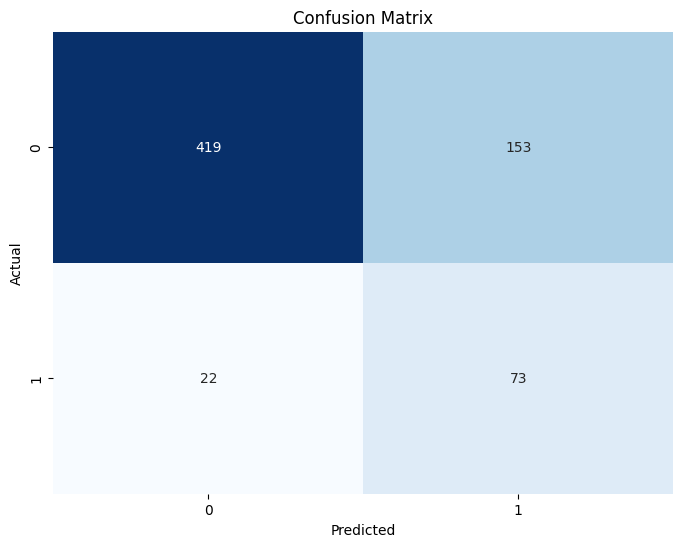

In [114]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    f1_score, roc_auc_score, confusion_matrix, classification_report
)
from sklearn.metrics import log_loss

# Assuming X_train, X_test, y_train, y_test are already prepared

# Convert data to NumPy arrays if needed
X_train_np = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_test_np = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test
y_train_np = y_train.to_numpy() if not isinstance(y_train, np.ndarray) else y_train
y_test_np = y_test.to_numpy() if not isinstance(y_test, np.ndarray) else y_test

# Initialize the Logistic Regression model
logreg_model = LogisticRegression(max_iter=1000)

# Fit the Logistic Regression model
logreg_model.fit(X_train_np, y_train_np)

# Calculate log loss at each iteration (for visualization purposes)
# Note: LogisticRegression doesn't provide the loss during training, so we calculate it manually
pred_probs_train = logreg_model.predict_proba(X_train_np)
train_loss = log_loss(y_train_np, pred_probs_train)

# Predictions
yhat_logreg = logreg_model.predict(X_test_np)

# Evaluation Metrics
accuracy_logreg = accuracy_score(y_test_np, yhat_logreg)
precision_weighted_logreg = precision_score(y_test_np, yhat_logreg, average='weighted')
recall_weighted_logreg = recall_score(y_test_np, yhat_logreg, average='weighted')
f1_weighted_logreg = f1_score(y_test_np, yhat_logreg, average='weighted')

# If binary classification, calculate ROC-AUC
if len(np.unique(y_test_np)) == 2:
    roc_auc_logreg = roc_auc_score(y_test_np, logreg_model.predict_proba(X_test_np)[:, 1])
else:
    roc_auc_logreg = "N/A (multi-class problem)"

classification_report_logreg = classification_report(y_test_np, yhat_logreg)
confusion_matrix_logreg = confusion_matrix(y_test_np, yhat_logreg)

# Print Results
print("Logistic Regression Results:")
print(f"Accuracy: {accuracy_logreg}")
print(f"Precision (Weighted Avg): {precision_weighted_logreg}")
print(f"Recall (Weighted Avg): {recall_weighted_logreg}")
print(f"F1-Score (Weighted Avg): {f1_weighted_logreg}")
print(f"ROC-AUC: {roc_auc_logreg}")
print("\nClassification Report:")
print(classification_report_logreg)
print("\nConfusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix_logreg, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

K Means

Silhouette Score: 0.5653697343464832
Inertia: 112909.06602538553


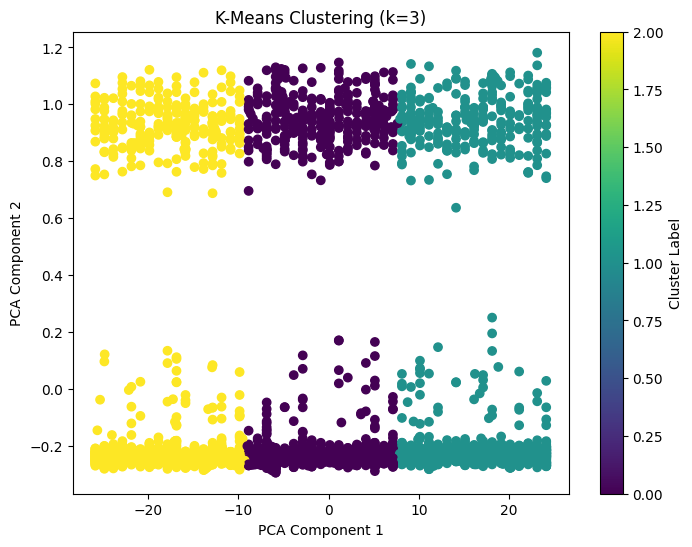

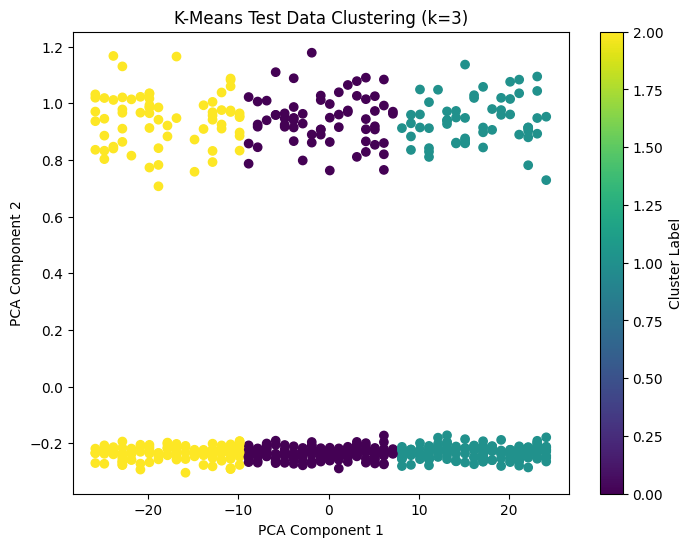

In [117]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Assuming X_train, X_test, y_train, y_test are already prepared

# Convert data to NumPy arrays if needed
X_train_np = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_test_np = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test

# Initialize K-Means with a specified number of clusters (k)
k = 3  # You can change k to test with different numbers of clusters
kmeans = KMeans(n_clusters=k, random_state=42)

# Fit the K-Means model
kmeans.fit(X_train_np)

# Predict the cluster for each data point
y_pred = kmeans.predict(X_test_np)

# Evaluate Clustering Quality

# Silhouette Score: Measures how similar each point is to its own cluster compared to other clusters
sil_score = silhouette_score(X_test_np, y_pred)

# Inertia: The sum of squared distances of samples to their closest cluster center (lower is better)
inertia = kmeans.inertia_

# Print the results
print(f"Silhouette Score: {sil_score}")
print(f"Inertia: {inertia}")

# Visualize the clusters using PCA for dimensionality reduction (if data is more than 2D)
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_np)

# Plotting the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=kmeans.labels_, cmap='viridis', marker='o')
plt.title(f'K-Means Clustering (k={k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

# If you want to visualize test data clusters as well, you can apply PCA on the test data
X_test_pca = pca.transform(X_test_np)
plt.figure(figsize=(8, 6))
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_pred, cmap='viridis', marker='o')
plt.title(f'K-Means Test Data Clustering (k={k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()


The Silhouette Score measures how well-separated the clusters are, with values ranging from -1 (incorrect clustering) to +1 (well-separated). A score of 0.29 indicates that the clusters are not very distinct.

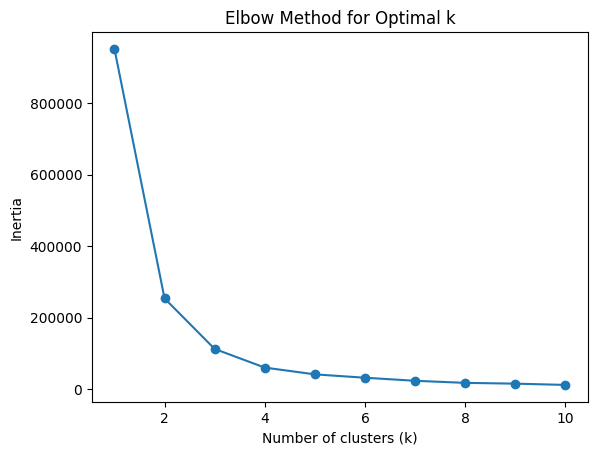

In [118]:
# Elbow Method to find optimal k
inertia_values = []
k_range = range(1, 11)  # Test k from 1 to 10
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_train_np)
    inertia_values.append(kmeans.inertia_)

plt.plot(k_range, inertia_values, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.show()


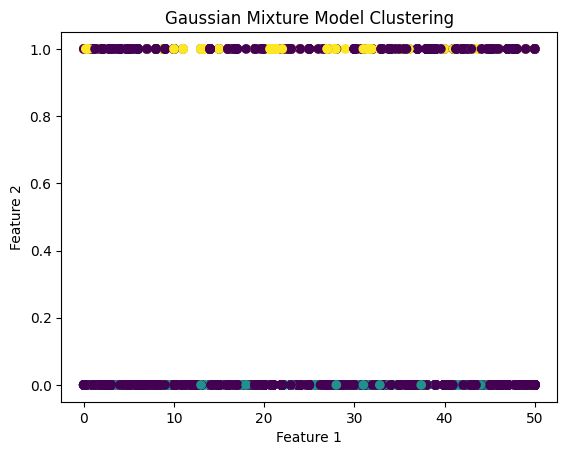

In [120]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# Initialize Gaussian Mixture Model
gmm = GaussianMixture(n_components=3, random_state=42)

# Fit the model
gmm_labels = gmm.fit_predict(X_train_np)

# Plot results
plt.scatter(X_train_np[:, 0], X_train_np[:, 1], c=gmm_labels, cmap='viridis', marker='o')
plt.title('Gaussian Mixture Model Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


In [211]:
from sklearn.metrics import silhouette_score
sil_score_gmm = silhouette_score(X_train_np, gmm_labels)
print(f"Silhouette Score: {sil_score_gmm}")


Silhouette Score: -0.09244505376690604


# IV-Evaluation

Wilcoxon Signed-Rank Test for Comparing Model Performance

In [221]:
from scipy.stats import wilcoxon
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Step 1: Train the models and collect predictions for each model
# Ensure you have predictions for each model: `yhat_xgboost`, `yhat_gbm`, `yhat_bagging`, `yhat_rf`, `yhat_tabnet`, `yhat_voting`
# Example: yhat_xgboost, yhat_gbm, etc., should contain the predictions on the test set

# Step 2: Compute Paired Metrics for Comparison
accuracy_xgboost = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_xgb)]
accuracy_gbm = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_gbm)]
accuracy_bagging = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_bagging)]
accuracy_rf = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_rf)]
accuracy_tabnet = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_tabnet)]
accuracy_voting = [accuracy_score([y_true], [y_pred]) for y_true, y_pred in zip(y_test, yhat_voting)]

precision_xgboost = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_xgb)]
precision_gbm = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_gbm)]
precision_bagging = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_bagging)]
precision_rf = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_rf)]
precision_tabnet = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_tabnet)]
precision_voting = [precision_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_voting)]

recall_xgboost = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_xgb)]
recall_gbm = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_gbm)]
recall_bagging = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_bagging)]
recall_rf = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_rf)]
recall_tabnet = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_tabnet)]
recall_voting = [recall_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_voting)]

f1_xgboost = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_xgb)]
f1_gbm = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_gbm)]
f1_bagging = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_bagging)]
f1_rf = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_rf)]
f1_tabnet = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_tabnet)]
f1_voting = [f1_score([y_true], [y_pred], average='weighted') for y_true, y_pred in zip(y_test, yhat_voting)]

# Step 3: Perform Wilcoxon Signed-Rank Test
print("\nWilcoxon Signed-Rank Test Results:")

# Accuracy
stat_acc_gbm, p_acc_gbm = wilcoxon(accuracy_gbm, accuracy_xgboost)
stat_acc_bagging, p_acc_bagging = wilcoxon(accuracy_bagging, accuracy_xgboost)
stat_acc_rf, p_acc_rf = wilcoxon(accuracy_rf, accuracy_xgboost)
stat_acc_tabnet, p_acc_tabnet = wilcoxon(accuracy_tabnet, accuracy_xgboost)
stat_acc_voting, p_acc_voting = wilcoxon(accuracy_voting, accuracy_xgboost)

# Precision
stat_prec_gbm, p_prec_gbm = wilcoxon(precision_gbm, precision_xgboost)
stat_prec_bagging, p_prec_bagging = wilcoxon(precision_bagging, precision_xgboost)
stat_prec_rf, p_prec_rf = wilcoxon(precision_rf, precision_xgboost)
stat_prec_tabnet, p_prec_tabnet = wilcoxon(precision_tabnet, precision_xgboost)
stat_prec_voting, p_prec_voting = wilcoxon(precision_voting, precision_xgboost)

# Recall
stat_rec_gbm, p_rec_gbm = wilcoxon(recall_gbm, recall_xgboost)
stat_rec_bagging, p_rec_bagging = wilcoxon(recall_bagging, recall_xgboost)
stat_rec_rf, p_rec_rf = wilcoxon(recall_rf, recall_xgboost)
stat_rec_tabnet, p_rec_tabnet = wilcoxon(recall_tabnet, recall_xgboost)
stat_rec_voting, p_rec_voting = wilcoxon(recall_voting, recall_xgboost)

# F1-Score
stat_f1_gbm, p_f1_gbm = wilcoxon(f1_gbm, f1_xgboost)
stat_f1_bagging, p_f1_bagging = wilcoxon(f1_bagging, f1_xgboost)
stat_f1_rf, p_f1_rf = wilcoxon(f1_rf, f1_xgboost)
stat_f1_tabnet, p_f1_tabnet = wilcoxon(f1_tabnet, f1_xgboost)
stat_f1_voting, p_f1_voting = wilcoxon(f1_voting, f1_xgboost)

# Step 4: Interpret Results
alpha = 0.05

# Accuracy
if p_acc_gbm < alpha:
    print(f"Significant difference in Accuracy between GBM and XGBoost.")
else:
    print(f"No significant difference in Accuracy between GBM and XGBoost.")

if p_acc_bagging < alpha:
    print(f"Significant difference in Accuracy between Bagging and XGBoost.")
else:
    print(f"No significant difference in Accuracy between Bagging and XGBoost.")

if p_acc_rf < alpha:
    print(f"Significant difference in Accuracy between Random Forest and XGBoost.")
else:
    print(f"No significant difference in Accuracy between Random Forest and XGBoost.")

if p_acc_tabnet < alpha:
    print(f"Significant difference in Accuracy between TabNet and XGBoost.")
else:
    print(f"No significant difference in Accuracy between TabNet and XGBoost.")

if p_acc_voting < alpha:
    print(f"Significant difference in Accuracy between Voting Classifier and XGBoost.")
else:
    print(f"No significant difference in Accuracy between Voting Classifier and XGBoost.")

# Precision
if p_prec_gbm < alpha:
    print(f"Significant difference in Precision between GBM and XGBoost.")
else:
    print(f"No significant difference in Precision between GBM and XGBoost.")

if p_prec_bagging < alpha:
    print(f"Significant difference in Precision between Bagging and XGBoost.")
else:
    print(f"No significant difference in Precision between Bagging and XGBoost.")

if p_prec_rf < alpha:
    print(f"Significant difference in Precision between Random Forest and XGBoost.")
else:
    print(f"No significant difference in Precision between Random Forest and XGBoost.")

if p_prec_tabnet < alpha:
    print(f"Significant difference in Precision between TabNet and XGBoost.")
else:
    print(f"No significant difference in Precision between TabNet and XGBoost.")

if p_prec_voting < alpha:
    print(f"Significant difference in Precision between Voting Classifier and XGBoost.")
else:
    print(f"No significant difference in Precision between Voting Classifier and XGBoost.")

# Recall
if p_rec_gbm < alpha:
    print(f"Significant difference in Recall between GBM and XGBoost.")
else:
    print(f"No significant difference in Recall between GBM and XGBoost.")

if p_rec_bagging < alpha:
    print(f"Significant difference in Recall between Bagging and XGBoost.")
else:
    print(f"No significant difference in Recall between Bagging and XGBoost.")

if p_rec_rf < alpha:
    print(f"Significant difference in Recall between Random Forest and XGBoost.")
else:
    print(f"No significant difference in Recall between Random Forest and XGBoost.")

if p_rec_tabnet < alpha:
    print(f"Significant difference in Recall between TabNet and XGBoost.")
else:
    print(f"No significant difference in Recall between TabNet and XGBoost.")

if p_rec_voting < alpha:
    print(f"Significant difference in Recall between Voting Classifier and XGBoost.")
else:
    print(f"No significant difference in Recall between Voting Classifier and XGBoost.")

# F1-Score
if p_f1_gbm < alpha:
    print(f"Significant difference in F1-Score between GBM and XGBoost.")
else:
    print(f"No significant difference in F1-Score between GBM and XGBoost.")

if p_f1_bagging < alpha:
    print(f"Significant difference in F1-Score between Bagging and XGBoost.")
else:
    print(f"No significant difference in F1-Score between Bagging and XGBoost.")

if p_f1_rf < alpha:
    print(f"Significant difference in F1-Score between Random Forest and XGBoost.")
else:
    print(f"No significant difference in F1-Score between Random Forest and XGBoost.")

if p_f1_tabnet < alpha:
    print(f"Significant difference in F1-Score between TabNet and XGBoost.")
else:
    print(f"No significant difference in F1-Score between TabNet and XGBoost.")

if p_f1_voting < alpha:
    print(f"Significant difference in F1-Score between Voting Classifier and XGBoost.")
else:
    print(f"No significant difference in F1-Score between Voting Classifier and XGBoost.")



Wilcoxon Signed-Rank Test Results:
No significant difference in Accuracy between GBM and XGBoost.
No significant difference in Accuracy between Bagging and XGBoost.
No significant difference in Accuracy between Random Forest and XGBoost.
Significant difference in Accuracy between TabNet and XGBoost.
Significant difference in Accuracy between Voting Classifier and XGBoost.
No significant difference in Precision between GBM and XGBoost.
No significant difference in Precision between Bagging and XGBoost.
No significant difference in Precision between Random Forest and XGBoost.
Significant difference in Precision between TabNet and XGBoost.
Significant difference in Precision between Voting Classifier and XGBoost.
No significant difference in Recall between GBM and XGBoost.
No significant difference in Recall between Bagging and XGBoost.
No significant difference in Recall between Random Forest and XGBoost.
Significant difference in Recall between TabNet and XGBoost.
Significant differenc

In [238]:
import lime
from lime.lime_tabular import LimeTabularExplainer
from sklearn.metrics import accuracy_score

# Initialize LIME Explainers
explainer_tabnet_lime = LimeTabularExplainer(
    X_train, 
    training_labels=y_train, 
    mode="classification", 
    discretize_continuous=True
)

explainer_mlp_lime = LimeTabularExplainer(
    X_train, 
    training_labels=y_train, 
    mode="classification", 
    discretize_continuous=True
)

# Select an instance for explanation (e.g., the first instance in the test set)
instance = X_test.iloc[0].to_numpy()

# Explain the prediction for TabNet
exp_tabnet = explainer_tabnet_lime.explain_instance(instance, tabnet_model.predict_proba)
exp_tabnet.show_in_notebook()

# Explain the prediction for MLP
exp_mlp = explainer_mlp_lime.explain_instance(instance, mlp_model.predict_proba)
exp_mlp.show_in_notebook()

# Calculate and print model accuracies
yhat_tabnet = tabnet_model.predict(X_test.to_numpy())
accuracy_tabnet = accuracy_score(y_test, yhat_tabnet)
print(f"TabNet Accuracy: {accuracy_tabnet}")

yhat_mlp = mlp_model.predict(X_test)
accuracy_mlp = accuracy_score(y_test, yhat_mlp)
print(f"MLP Accuracy: {accuracy_mlp}")


TabNet Accuracy: 0.9100449775112444
MLP Accuracy: 0.7856071964017991


The LIME explanations show how the TabNet and MLP models make predictions for a specific instance. TabNet predicts class 0 with 57% confidence, while MLP is more confident, predicting class 0 with 91% probability. The most influential feature for class 1 is Feature 2 with a value of 0.00, while features like Feature 3 (-0.60) and Feature 6 (-0.55) strongly support class 0. Overall, MLP performs better for this instance as it gives a clearer and more confident prediction compared to TabNet.

# Comparaison Tables for machine learning models

### Tree-Based Models

| Algorithm                | Accuracy |
|--------------------------|----------|
| Decision Tree            |   81%    |
| AdaBoost                 |   85.9%  |
| Random Forest            |   93.4%  |
| Bagging                  |   93.5%  |
| GBM                      |   94.3%  |
| XGBoost                  |   94.6%  |


### Neural Networks

| Algorithm                | Accuracy |
|--------------------------|----------|
| MLP                      |   81.2%  |
| TabNet                   |   91%    |

### Other Models

| Algorithm                | Accuracy |
|--------------------------|----------|
| Gaussian                 |   64%    |
| Linear Regression        |   73.6%  |
| Logistic Regression      |   73.7%  |
| SVC                      |   76.7%  |
| KNN                      |   81%    |
| Voting Classifier        |   91%    |


# V-Deployment :

In [239]:
# Sauvegarder le modèle dans un fichier .pkl
model_filename = "tabnet_model.pkl"
joblib.dump(tabnet_model, model_filename)
print(f"\nModèle MLP sauvegardé dans le fichier : {model_filename}")


Modèle MLP sauvegardé dans le fichier : tabnet_model.pkl


In [240]:
# Sauvegarder le modèle dans un fichier .pkl
model_filename = "xgb_model.pkl"
joblib.dump(xgb_clf, model_filename)
print(f"\nModèle MLP sauvegardé dans le fichier : {model_filename}")


Modèle MLP sauvegardé dans le fichier : xgb_model.pkl


In [65]:
xgb_clf.get_booster().save_model("xgb_model.json")

In [241]:
# Sauvegarder le modèle dans un fichier .pkl
model_filename = "voting_model.pkl"
joblib.dump(voting_clf_tuned, model_filename)
print(f"\nModèle MLP sauvegardé dans le fichier : {model_filename}")


Modèle MLP sauvegardé dans le fichier : voting_model.pkl


In [69]:
import joblib
model_filename = "gbm_model.pkl"
joblib.dump(best_gbm_model, model_filename)
print(f"\nModèle MLP sauvegardé dans le fichier : {model_filename}")


Modèle MLP sauvegardé dans le fichier : gbm_model.pkl
